In [2]:
import numpy as np
import pandas as pd
import os
from re import search
import shutil
import natsort
from PIL import Image
import matplotlib.pyplot as plt
from tqdm import tqdm
import cv2
import seaborn as sns
import hashlib
from IPython.display import display
from PIL import Image
from tqdm import tqdm
tqdm.pandas()


In [3]:
train=pd.read_csv(r"/content/drive/MyDrive/apple/labels/train.csv")
test=pd.read_csv(r"/content/drive/MyDrive/apple/labels/test.csv")

In [4]:
DIR=r'/content/drive/MyDrive/apple'

In [5]:
train.head()

,image_id,healthy,multiple_diseases,rust,scab
0,Train_0,0,0,0,1
1,Train_1,0,1,0,0
2,Train_2,1,0,0,0
3,Train_3,0,0,1,0
4,Train_4,1,0,0,0


In [6]:
test.head()

,image_id
0,Test_0
1,Test_1
2,Test_2
3,Test_3
4,Test_4


In [ ]:
train.dtypes

image_id             object
healthy               int64
multiple_diseases     int64
rust                  int64
scab                  int64
dtype: object

In [ ]:
def get_category_wise_counts(df, tgt_label_class, lbl_category):
    """
    Description : This function is created for generating the infected or non-infected statistics of every disease target label.

    Input parameters : It accepts the below 3 inputs:
        - df : `pandas dataframe`
            The dataframe that contains the details of captured samples.
        - tgt_label_class : `str`
            This represents the target class label.
        - lbl_category : `str`
            This represents the target label category that you want to written with the stats.

    Return : It returns the below object:
        - tgt_class_val_counts_df : `pandas dataframe`
            This contains the stats of each target class label.
    """
    tgt_class_val_counts_df = pd.DataFrame(df[[tgt_label_class]].value_counts())
    tgt_class_val_counts_df.reset_index(drop=False, inplace=True)
    tgt_class_val_counts_df['category'] = lbl_category
    tgt_class_val_counts_df.columns = ['infected','counts','category']
    if lbl_category != 'healthy':
        tgt_class_val_counts_df['infected'] = tgt_class_val_counts_df['infected'].apply(lambda val: 'No' if val == 0 else 'Yes')
    else:
        tgt_class_val_counts_df['infected'] = tgt_class_val_counts_df['infected'].apply(lambda val: 'Yes' if val == 0 else 'No')
    return tgt_class_val_counts_df

In [ ]:
healthy_stats = get_category_wise_counts(train, 'healthy', 'healthy')
healthy_stats
multiple_diseases_stats = get_category_wise_counts(train, 'multiple_diseases', 'multiple_diseases')
multiple_diseases_stats
rust_stats = get_category_wise_counts(train, 'rust', 'rust')
rust_stats
scab_stats = get_category_wise_counts(train, 'scab', 'scab')
scab_stats
tgt_diseases_dist = pd.concat([healthy_stats, multiple_diseases_stats, rust_stats, scab_stats], axis=0).reset_index(drop=True)
tgt_diseases_dist

,infected,counts,category
0,Yes,1305,healthy
1,No,516,healthy
2,No,1730,multiple_diseases
3,Yes,91,multiple_diseases
4,No,1199,rust
5,Yes,622,rust
6,No,1229,scab
7,Yes,592,scab


In [ ]:
tot_records = np.sum(tgt_diseases_dist[tgt_diseases_dist['category'] == 'healthy']['counts'].values)
tot_records

1821

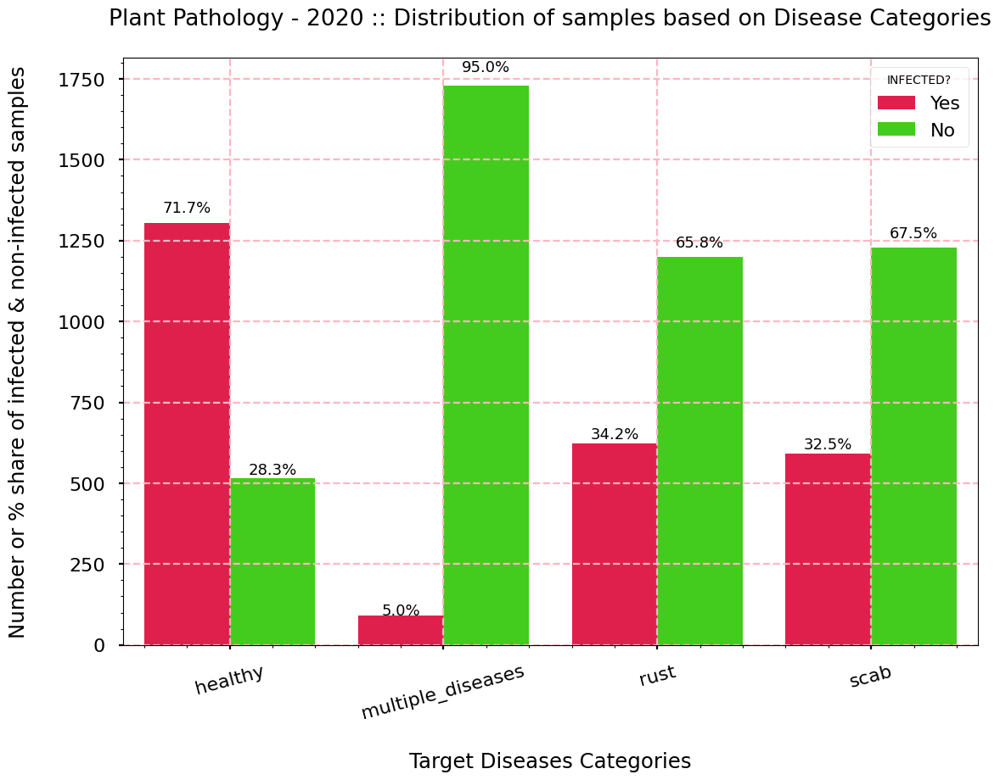

In [ ]:
with plt.style.context('seaborn-poster'):
    plt.figure(figsize=(13,9))
    fig = sns.barplot(data=tgt_diseases_dist, x='category', y='counts', hue='infected', palette='prism_r')
    # Using the "patches" function we will get the location of the rectangle bars from the graph.
    ## Then by using those location(width & height) values we will add the annotations
    for p in fig.patches:
        width = p.get_width()
        height = p.get_height()
        x, y = p.get_xy()
        fig.annotate(f'{str(round((height*100)/tot_records,1))+"%"}', (x + width/2, y + height*1.025), ha='center', fontsize=13, rotation=0)
    # Providing the labels and title to the graph
    plt.xlabel("\nTarget Diseases Categories")
    plt.xticks(rotation=15)
    plt.ylabel("Number or % share of infected & non-infected samples\n")
    plt.minorticks_on()
    plt.grid(which='major', linestyle="--", color='lightpink')
    plt.title("Plant Pathology - 2020 :: Distribution of samples based on Disease Categories\n")
    plt.legend(title='INFECTED?')

In [ ]:
import plotly.express as px
import plotly.graph_objects as go

In [ ]:
# Number and % of records that belongs to each target category
tgt_classes_share = go.Figure([go.Pie(labels=train.columns[1:],
                                      values=train.iloc[:, 1:].sum().values)])

## Providing the figure labels properties
tgt_classes_share.update_layout(title_text="Number or % of records in each target category ",
                                template="ggplot2",
                                font={"color":"black", "family":"calibri", "size":15})

## Providing the figure properties
tgt_classes_share.data[0].marker.line.color = 'black'
tgt_classes_share.data[0].marker.line.width = 2.8
tgt_classes_share.show()

In [ ]:
train_image_only_mul_diseases_df = train[train['multiple_diseases'] == 1]
train_image_only_mul_diseases_df

,image_id,healthy,multiple_diseases,rust,scab
1,Train_1,0,1,0,0
6,Train_6,0,1,0,0
25,Train_25,0,1,0,0
36,Train_36,0,1,0,0
62,Train_62,0,1,0,0
...,...,...,...,...,...
1708,Train_1708,0,1,0,0
1779,Train_1779,0,1,0,0
1780,Train_1780,0,1,0,0
1784,Train_1784,0,1,0,0


In [ ]:
only_mul_dis_healthy_stats = get_category_wise_counts(train_image_only_mul_diseases_df, 'healthy', 'healthy')
only_mul_dis_healthy_stats
only_mul_dis_multiple_diseases_stats = get_category_wise_counts(train_image_only_mul_diseases_df, 'multiple_diseases', 'multiple_diseases')
only_mul_dis_multiple_diseases_stats
only_mul_dis_rust_stats = get_category_wise_counts(train_image_only_mul_diseases_df, 'rust', 'rust')
only_mul_dis_rust_stats
only_mul_dis_scab_stats = get_category_wise_counts(train_image_only_mul_diseases_df, 'scab', 'scab')
only_mul_dis_scab_stats
only_mul_dis_tgt_diseases_dist = pd.concat([only_mul_dis_healthy_stats, only_mul_dis_multiple_diseases_stats,
                                            only_mul_dis_rust_stats, only_mul_dis_scab_stats], axis=0).reset_index(drop=True)
only_mul_dis_tgt_diseases_dist

,infected,counts,category
0,Yes,91,healthy
1,Yes,91,multiple_diseases
2,No,91,rust
3,No,91,scab


In [ ]:
tmp_df_healthy = {'infected': 'No', 'counts': 0, 'category': 'healthy'}
tmp_df_mul_dis = {'infected': 'No', 'counts': 0, 'category': 'multiple_diseases'}
tmp_df_rust = {'infected': 'Yes', 'counts': 0, 'category': 'rust'}
tmp_df_scab = {'infected': 'Yes', 'counts': 0, 'category': 'scab'}

only_mul_dis_tgt_diseases_dist = only_mul_dis_tgt_diseases_dist.append([tmp_df_healthy, tmp_df_mul_dis, tmp_df_rust, tmp_df_scab],    ignore_index = True)
only_mul_dis_tgt_diseases_dist

<ipython-input-16-9aaf7a95e357>:6: FutureWarning:

The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.



,infected,counts,category
0,Yes,91,healthy
1,Yes,91,multiple_diseases
2,No,91,rust
3,No,91,scab
4,No,0,healthy
5,No,0,multiple_diseases
6,Yes,0,rust
7,Yes,0,scab


In [ ]:
only_mul_dis_tot_records = np.sum(only_mul_dis_tgt_diseases_dist[only_mul_dis_tgt_diseases_dist['category'] == 'healthy']['counts'].values)
only_mul_dis_tot_records

91

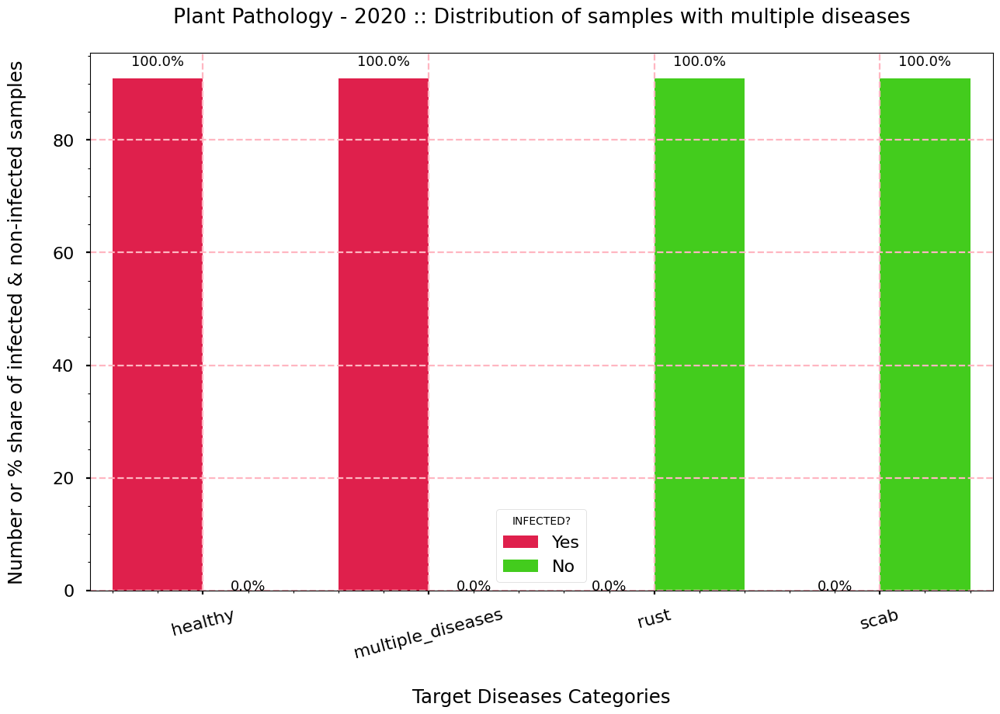

In [ ]:
with plt.style.context('seaborn-poster'):
    plt.figure(figsize=(15,9))
    fig = sns.barplot(data=only_mul_dis_tgt_diseases_dist, x='category', y='counts', hue='infected', palette='prism_r')
    # Using the "patches" function we will get the location of the rectangle bars from the graph.
    ## Then by using those location(width & height) values we will add the annotations
    for p in fig.patches:
        width = p.get_width()
        height = p.get_height()
        x, y = p.get_xy()
        fig.annotate(f'{str(round((height*100)/only_mul_dis_tot_records,1))+"%"}', (x + width/2, y + height*1.025), ha='center', fontsize=13, rotation=0)
    # Providing the labels and title to the graph
    plt.xlabel("\nTarget Diseases Categories")
    plt.xticks(rotation=15)
    plt.ylabel("Number or % share of infected & non-infected samples\n")
    plt.minorticks_on()
    plt.grid(which='major', linestyle="--", color='lightpink')
    plt.title("Plant Pathology - 2020 :: Distribution of samples with multiple diseases\n")
    plt.legend(title='INFECTED?')

In [ ]:
train_image_only_unhealthy_df = train[train['healthy'] == 0]
train_image_only_unhealthy_df

,image_id,healthy,multiple_diseases,rust,scab
0,Train_0,0,0,0,1
1,Train_1,0,1,0,0
3,Train_3,0,0,1,0
6,Train_6,0,1,0,0
7,Train_7,0,0,0,1
...,...,...,...,...,...
1813,Train_1813,0,0,1,0
1815,Train_1815,0,1,0,0
1816,Train_1816,0,0,0,1
1819,Train_1819,0,0,1,0


In [ ]:
only_unhealthy_stats = get_category_wise_counts(train_image_only_unhealthy_df, 'healthy', 'healthy')
only_unhealthy_stats
only_unhealthy_multiple_diseases_stats = get_category_wise_counts(train_image_only_unhealthy_df, 'multiple_diseases', 'multiple_diseases')
only_unhealthy_multiple_diseases_stats
only_unhealthy_rust_stats = get_category_wise_counts(train_image_only_unhealthy_df, 'rust', 'rust')
only_unhealthy_rust_stats
only_unhealthy_scab_stats = get_category_wise_counts(train_image_only_unhealthy_df, 'scab', 'scab')
only_unhealthy_scab_stats
only_unhealthy_tgt_diseases_dist = pd.concat([only_unhealthy_stats, only_unhealthy_multiple_diseases_stats,
                                              only_unhealthy_rust_stats, only_unhealthy_scab_stats], axis=0).reset_index(drop=True)
only_unhealthy_tgt_diseases_dist

,infected,counts,category
0,Yes,1305,healthy
1,No,1214,multiple_diseases
2,Yes,91,multiple_diseases
3,No,683,rust
4,Yes,622,rust
5,No,713,scab
6,Yes,592,scab


In [ ]:
tmp_df_unhealthy = {'infected': 'No', 'counts': 0, 'category': 'healthy'}

only_unhealthy_tgt_diseases_dist = only_unhealthy_tgt_diseases_dist.append(tmp_df_unhealthy, ignore_index = True)
only_unhealthy_tgt_diseases_dist

<ipython-input-21-84317e0ae890>:3: FutureWarning:

The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.



,infected,counts,category
0,Yes,1305,healthy
1,No,1214,multiple_diseases
2,Yes,91,multiple_diseases
3,No,683,rust
4,Yes,622,rust
5,No,713,scab
6,Yes,592,scab
7,No,0,healthy


In [ ]:
only_unhealthy_tot_records = np.sum(only_unhealthy_tgt_diseases_dist[only_unhealthy_tgt_diseases_dist['category'] == 'healthy']['counts'].values)
only_unhealthy_tot_records

1305

,image_id,healthy,multiple_diseases,rust,scab



### Therefore, number of un-healthy samples are suffering from either one or both RUST & SCAB at the same time are --> 0 ### 




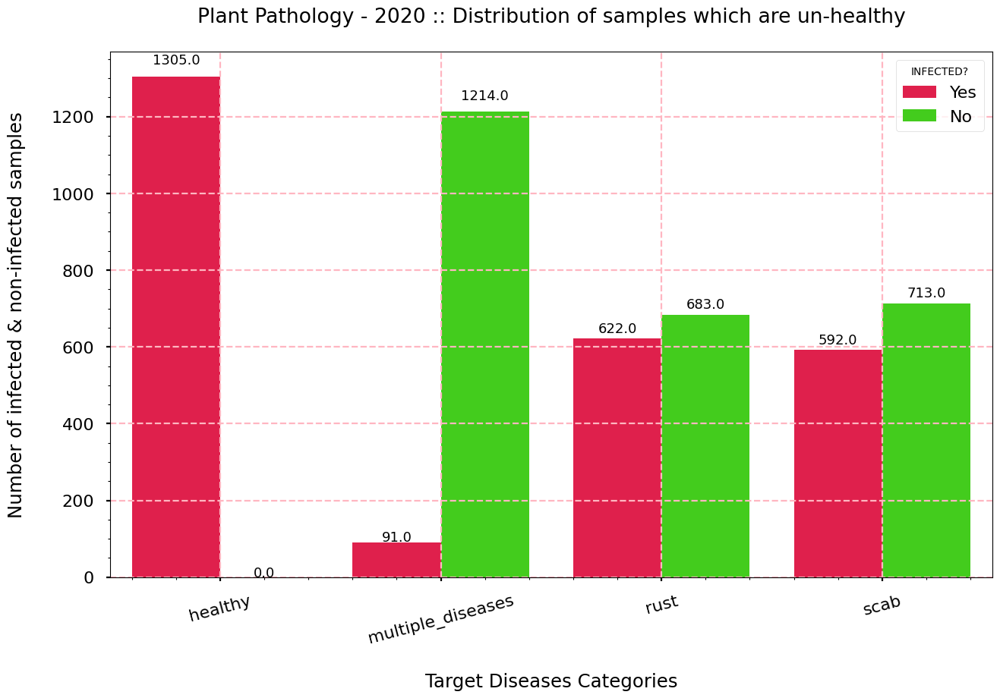

In [ ]:
# This will print the sample which are un-healthy and suffering from RUST and SCAB at the same time
display(train_image_only_unhealthy_df[(train_image_only_unhealthy_df['rust'] == 1) & (train_image_only_unhealthy_df['scab'] == 1)])

num_rec = train_image_only_unhealthy_df[(train_image_only_unhealthy_df['rust'] == 1) & (train_image_only_unhealthy_df['scab'] == 1)].shape[0]
print("\n### Therefore, number of un-healthy samples are suffering from either one or both RUST & SCAB at the same time are --> {} ### \n\n".format(num_rec))

# Displaying the same via graph
with plt.style.context('seaborn-poster'):
    plt.figure(figsize=(15,9))
    fig = sns.barplot(data=only_unhealthy_tgt_diseases_dist, x='category', y='counts', hue='infected', palette='prism_r')
    # Using the "patches" function we will get the location of the rectangle bars from the graph.
    ## Then by using those location(width & height) values we will add the annotations
    for p in fig.patches:
        width = p.get_width()
        height = p.get_height()
        x, y = p.get_xy()
        fig.annotate(f'{str(height)}', (x + width/2, y + height*1.025), ha='center', fontsize=13, rotation=0)
    # Providing the labels and title to the graph
    plt.xlabel("\nTarget Diseases Categories")
    plt.xticks(rotation=15)
    plt.ylabel("Number of infected & non-infected samples\n")
    plt.minorticks_on()
    plt.grid(which='major', linestyle="--", color='lightpink')
    plt.title("Plant Pathology - 2020 :: Distribution of samples which are un-healthy\n")
    plt.legend(title='INFECTED?')

In [ ]:
# Displaying the relationship b/w the TARGET Categories
tgt_classes_relation = px.parallel_categories(train[["healthy", "multiple_diseases", "rust", "scab"]],
                             color="healthy",
                             color_continuous_scale="tropic",
                             title="Relationship b/w Target Categories")
tgt_classes_relation

In [ ]:
def plot_big_img(img_name, img_category, start_coord=(450,1500), end_coord=(750,1500), org_axis="on", flag=0):
    """
    Description : This function is created for visualizing some of the IMAGES in bigger size.

    Input parameters : It accepts the below 4 inputs:
        - img_name : `str`
            Image name that you want to display.
        - img_category : `str`
            Disease category to which the image belongs.
        - start_coord : `tuple`
            Starting X,Y co-ordinates of the bounding/focus box
        - end_coord : `tuple`
            Ending X,Y co-ordinates of the bounding/focus box
        - org_axis : `str`
            By default it is 'on', but it can also take 'off'. Means whether we want to show the axis lines in the original image.
        - flag : int
            By default it is 0, means GRAYSCALE.

    Return : None
    """
    # Reading the image name and its location
    loc = os.path.join(os.path.join(os.path.join("..", "input"), "plant-pathology-2020-fgvc7"), "images")
    img_loc = os.path.join(loc,img_name)

    # Reading the original image
    ## -1 represents IMREAD_UNCHANGED
    org_img_read = cv2.imread(img_loc, -1)
    org_img_read = cv2.cvtColor(org_img_read, cv2.COLOR_BGR2RGB)
     # Reading the original image for adding the potential focus area
    ## -1 represents IMREAD_UNCHANGED
    img_read_tbs = cv2.imread(img_loc, -1)
    img_read_tbs = cv2.cvtColor(img_read_tbs, cv2.COLOR_BGR2RGB)
    bb_img = cv2.rectangle(img_read_tbs, start_coord, end_coord, color=(255,0,0), thickness=13)

    # Reading the original image for adding the potential focus area on grayscale image
    ## 0 represents GRAYSCALE
    img_read_gray = cv2.imread(img_loc, flag)
    bb_gray_img = cv2.rectangle(img_read_gray, start_coord, end_coord, color=(255,0,0), thickness=13)

    # Plotting the images in the sub-plot
    with plt.style.context('seaborn'):
        fig, ax = plt.subplots(nrows=1, ncols=3, figsize=(17,7), sharex=False, sharey=False)
        # Plotting the original image
        ax[0].imshow(org_img_read, aspect='auto')
        ax[0].axis(org_axis)
        ax[0].set_title("Original Image : RGB")

        # Plotting the segmented image
        ax[1].imshow(bb_img, aspect='auto')
        ax[1].axis("off")
        ax[1].set_title("Focus Box : RGB")

        # Plotting the segmented image
        ax[2].imshow(bb_gray_img, aspect='auto')
        ax[2].axis("off")
        ax[2].set_title("Focus Box : Grayscale")
        fig.suptitle("###   {}  <------>  {}   ###\n".format(img_category.upper(), img_name))

In [ ]:
# Seggregating TRAIN & TEST Images in different lists
all_images_loc = os.path.join(os.path.join(os.path.join("..", "input"), "/content/drive/MyDrive/apple/images/Original Dataset"))
all_images_names = os.listdir(all_images_loc)

all_test_imgs_names = []
all_train_imgs_names = []
for img in all_images_names:
    if img.split("_")[0] == "Test":
        all_test_imgs_names.append(os.path.join(all_images_loc,img))
    else:
        all_train_imgs_names.append(os.path.join(all_images_loc,img))

In [ ]:
# The count of images should be 1821 for TRAIN & TEST sets
len(all_test_imgs_names), len(all_train_imgs_names)

(1834, 1821)

In [ ]:
# Creating TRAIN & TEST images dataframes
all_train_imgs_names_df = pd.DataFrame(all_train_imgs_names, columns=['images_loc'])
all_test_imgs_names_df = pd.DataFrame(all_test_imgs_names, columns=['images_loc'])

In [ ]:
def generate_md5_code(image):
    """
    Description : This function is created for generating the MD5 hexadecimal code of every image.

    Input : It accepts one 1 input parameter:
        - image : `str`
            Path of image with its name.

    Return : It returns the below object:
        - md5_code : `str`
            Hexadecimal code.
    """
    img = cv2.imread(image)
    md5_generator = hashlib.md5(img)
    md5_code = md5_generator.hexdigest()
    return md5_code

In [ ]:
# All image names with path in a dataframe
all_df = pd.concat([all_train_imgs_names_df, all_test_imgs_names_df], axis=0).reset_index(drop=True)
all_df

,images_loc
0,/content/drive/MyDrive/apple/images/Original D...
1,/content/drive/MyDrive/apple/images/Original D...
2,/content/drive/MyDrive/apple/images/Original D...
3,/content/drive/MyDrive/apple/images/Original D...
4,/content/drive/MyDrive/apple/images/Original D...
...,...
3650,/content/drive/MyDrive/apple/images/Original D...
3651,/content/drive/MyDrive/apple/images/Original D...
3652,/content/drive/MyDrive/apple/images/Original D...
3653,/content/drive/MyDrive/apple/images/Original D...


In [ ]:
# Generating the MD5 hexadecimal codes of all images
all_df['md5_code'] = all_df['images_loc'].apply(lambda img: generate_md5_code(img))
# Count the occurences of every code
all_md5_counts = pd.DataFrame(all_df['md5_code'].value_counts()).reset_index(drop=False)
all_md5_counts.columns = ['md5_code', 'counts']
all_md5_counts

,md5_code,counts
0,a58a14af878cfe29712a9ad1697c4b54,2
1,2520c896807f6221a70e9e42a02f0a61,2
2,ac55b42f343e76d41fc7c5cf2fe1b84a,2
3,81f763a49d628fe3df6425afe7bdde2d,2
4,dfa171069af51f29e493334782e71124,2
...,...,...
3632,20b56eaad4decad0b648eb3ba9eee774,1
3633,e139fc6d0720e4130db8de3ac863b8dd,1
3634,463e2cc99edb2b86727414040be582a3,1
3635,4927776261a18555e3f170385923b3c9,1


In [ ]:
# Joining the images names and paths with MD5 Occurences
all_images_md5_counts_df = pd.merge(left=all_df, right=all_md5_counts, on='md5_code')
all_images_md5_counts_df.head(10)

,images_loc,md5_code,counts
0,/content/drive/MyDrive/apple/images/Original D...,9aace9e793ef65cf14e9fe9fce2faffc,1
1,/content/drive/MyDrive/apple/images/Original D...,14666480e7508d070cb5bd2b6aedb7c3,1
2,/content/drive/MyDrive/apple/images/Original D...,2d526925de267e12ff3e534515229adb,1
3,/content/drive/MyDrive/apple/images/Original D...,6b30ea95db43d7f8a838c02e2f3bf430,1
4,/content/drive/MyDrive/apple/images/Original D...,62cb8f9f39c35bbfde2c3fe4f166bff4,1
5,/content/drive/MyDrive/apple/images/Original D...,a173919a783cc08d4c21e5e324f8ecf6,1
6,/content/drive/MyDrive/apple/images/Original D...,c5d14d11475db27707241ae3200a24f0,1
7,/content/drive/MyDrive/apple/images/Original D...,58e371a556d9fd1683a0773f22c9e5e8,1
8,/content/drive/MyDrive/apple/images/Original D...,6e7fab3dd93036727aad42fc45e18edf,1
9,/content/drive/MyDrive/apple/images/Original D...,81258d10c4566b7c77e59af6d6cb5b54,1


In [ ]:
# Duplicate images in the TRAIN & TEST images
duplicates_df = all_images_md5_counts_df[all_images_md5_counts_df['counts'] == 2].copy(deep=True)
duplicates_df['images_loc'] = duplicates_df['images_loc'].apply(lambda path: path.split("/")[-1])
duplicates_df.reset_index(drop=True, inplace=True)
duplicates_df

,images_loc,md5_code,counts
0,Train_1703.jpg,c09f4dbe73e284fa865473015c1265ef,2
1,Test_1407.jpg,c09f4dbe73e284fa865473015c1265ef,2
2,Train_1505.jpg,a58a14af878cfe29712a9ad1697c4b54,2
3,Test_829.jpg,a58a14af878cfe29712a9ad1697c4b54,2
4,Train_1173.jpg,81f763a49d628fe3df6425afe7bdde2d,2
5,Train_379.jpg,81f763a49d628fe3df6425afe7bdde2d,2
6,Test_1757 (1).jpg,dfa171069af51f29e493334782e71124,2
7,Test_1757.jpg,dfa171069af51f29e493334782e71124,2
8,Test_1759 (1).jpg,a3f279a794a0539830a4a1682c133c72,2
9,Test_1759.jpg,a3f279a794a0539830a4a1682c133c72,2


In [ ]:
# Let's display the duplicate images
duplicate_images = duplicates_df['images_loc'].values
duplicate_images

array(['Train_1703.jpg', 'Test_1407.jpg', 'Train_1505.jpg',
       'Test_829.jpg', 'Train_1173.jpg', 'Train_379.jpg',
       'Test_1757 (1).jpg', 'Test_1757.jpg', 'Test_1759 (1).jpg',
       'Test_1759.jpg', 'Test_1758 (1).jpg', 'Test_1758.jpg',
       'Test_1754 (1).jpg', 'Test_1754.jpg', 'Test_1756 (1).jpg',
       'Test_1756.jpg', 'Test_1755 (1).jpg', 'Test_1755.jpg',
       'Test_1685 (1).jpg', 'Test_1685.jpg', 'Test_1753 (1).jpg',
       'Test_1753.jpg', 'Test_1683 (1).jpg', 'Test_1683.jpg',
       'Test_1681 (1).jpg', 'Test_1681.jpg', 'Test_1687 (1).jpg',
       'Test_1687.jpg', 'Test_1684 (1).jpg', 'Test_1684.jpg',
       'Test_1691.jpg', 'Test_683.jpg', 'Test_1686 (1).jpg',
       'Test_1686.jpg', 'Test_1212.jpg', 'Test_570.jpg'], dtype=object)

In [ ]:
all_images_loc


'/content/drive/MyDrive/apple/images/Original Dataset'

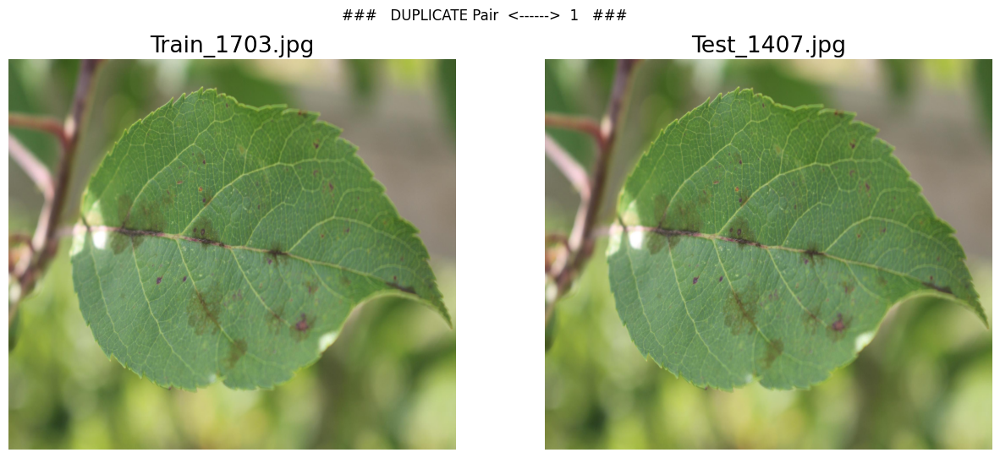

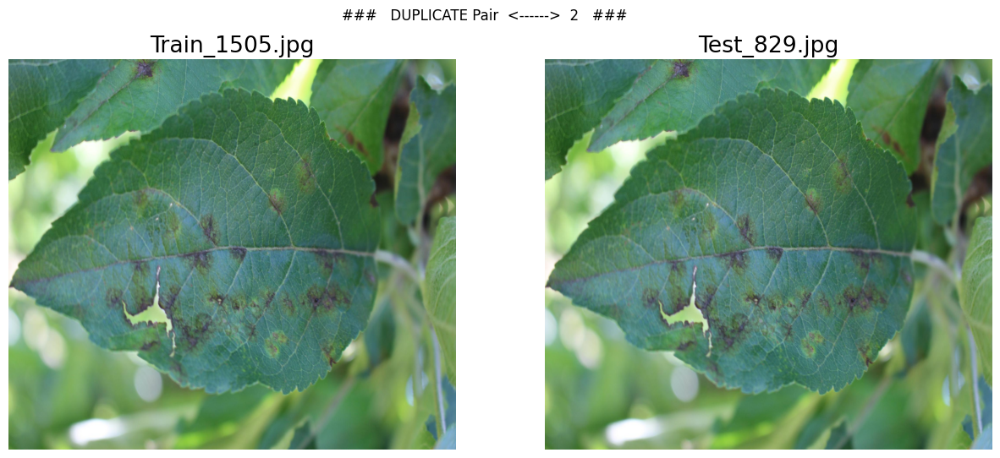

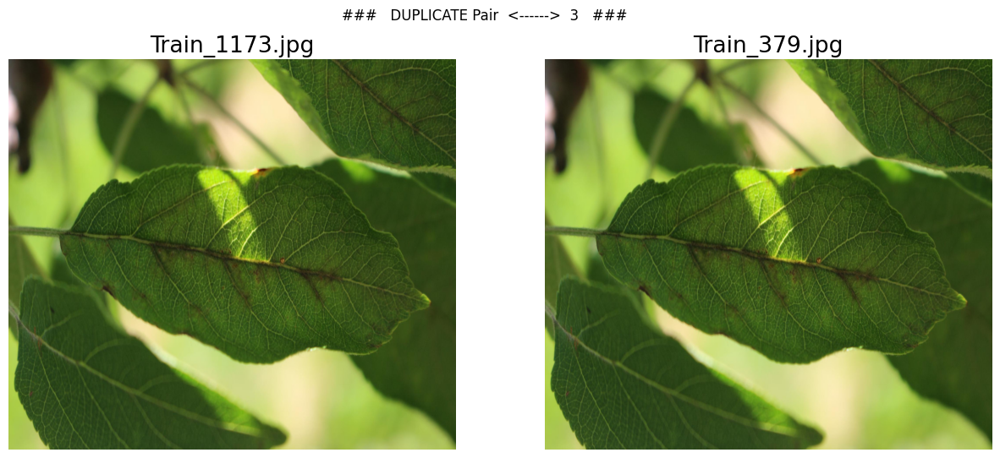

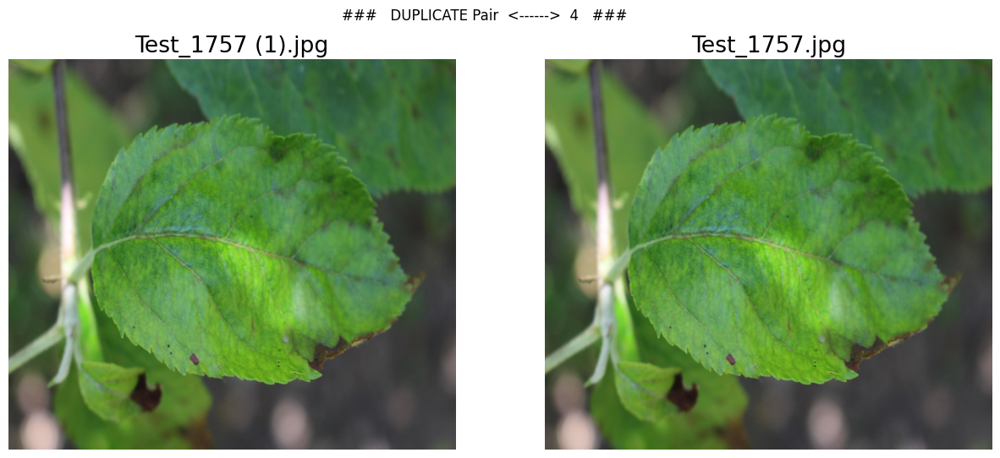

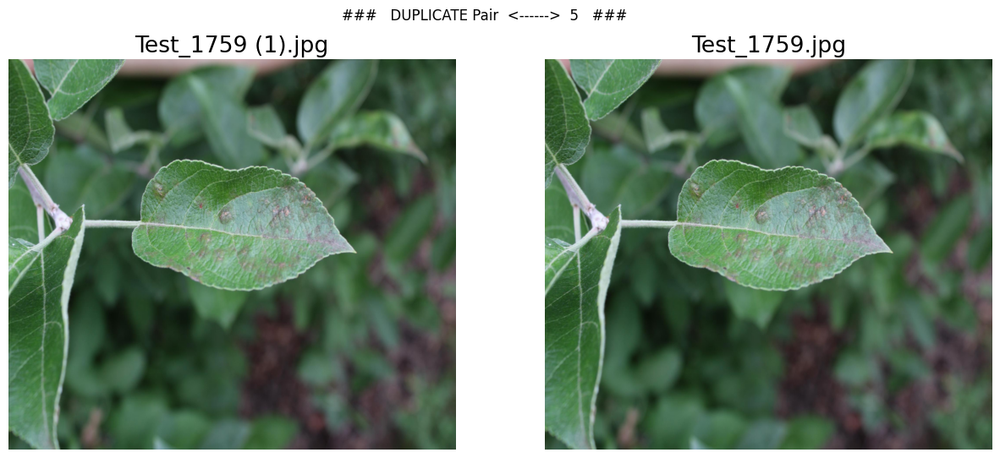

...

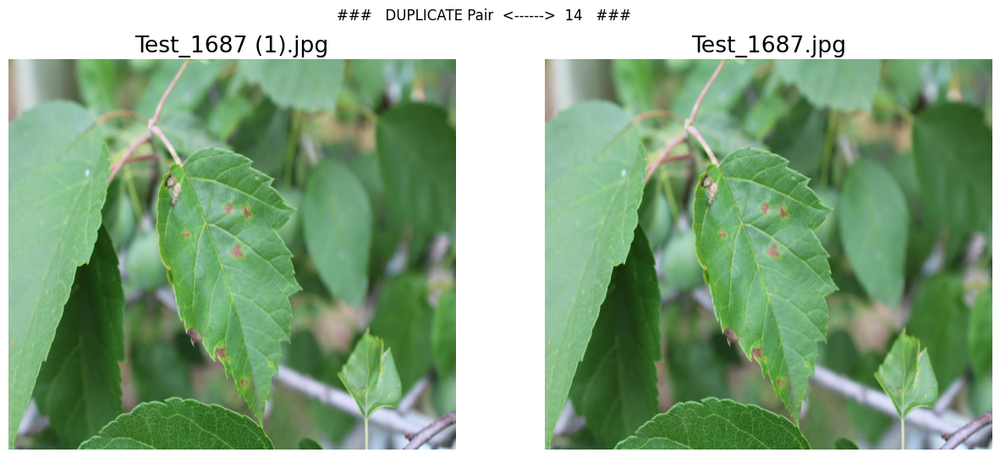

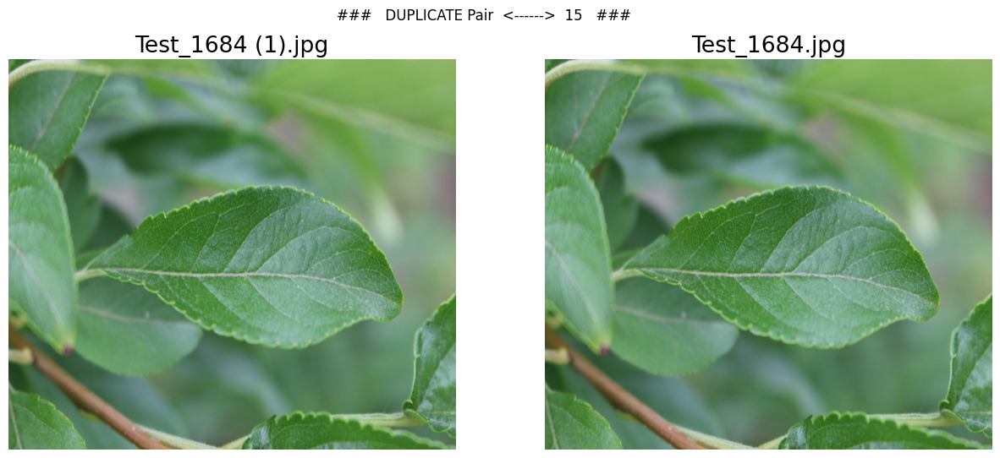

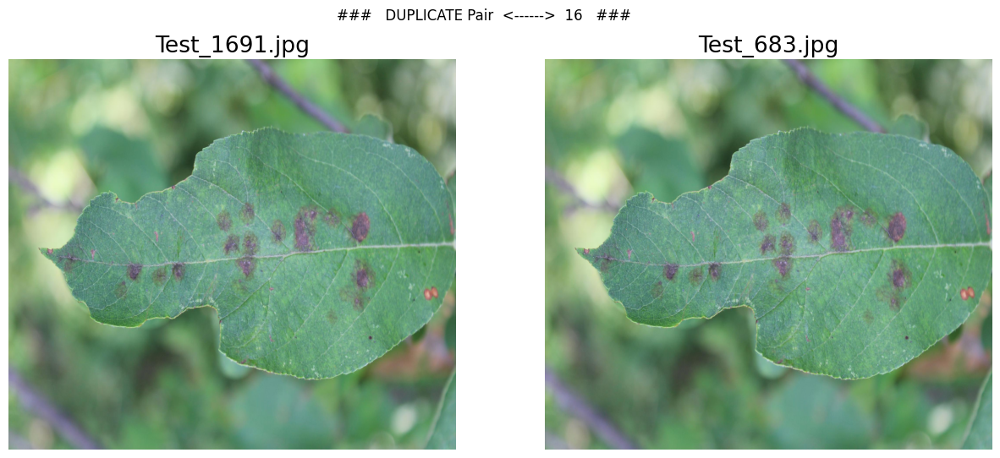

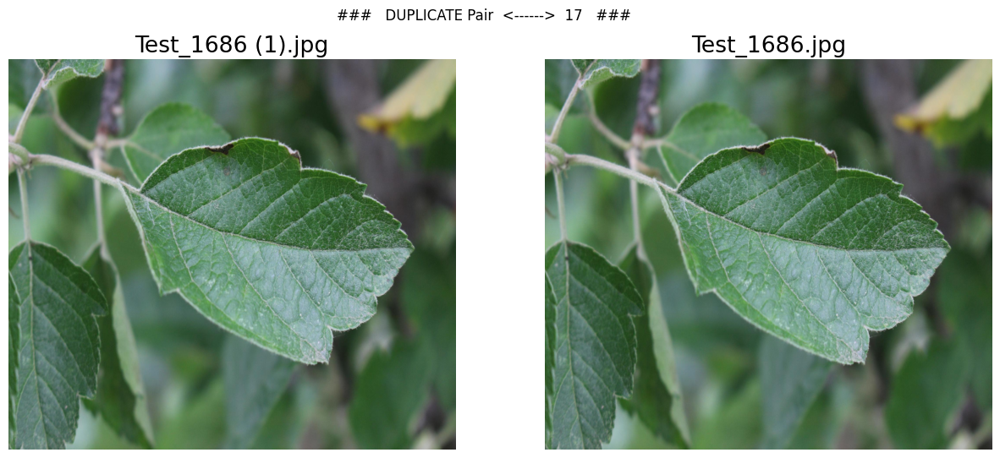

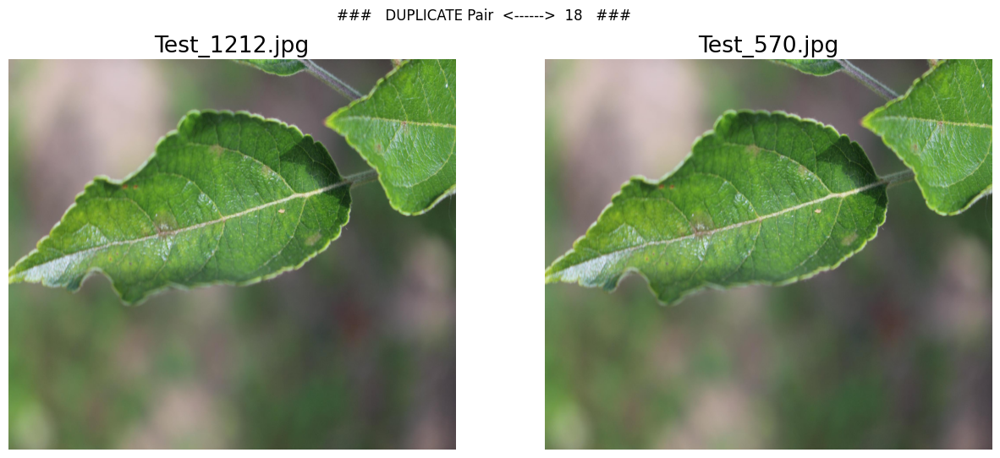

In [ ]:
col1_images = duplicate_images[::2]
col2_images = duplicate_images[1::2]

for i in range(len(col1_images)):
    with plt.style.context('seaborn-poster'):
            fig, ax = plt.subplots(nrows=1, ncols=2, figsize=(15,6), sharex=False, sharey=False)
            # Storing the images with specific path or location
            img1_path = os.path.join(all_images_loc, col1_images[i])
            img2_path = os.path.join(all_images_loc, col2_images[i])

            # Reading the images
            img1 = cv2.imread(img1_path)
            img1 = cv2.cvtColor(img1, cv2.COLOR_BGR2RGB)

            img2 = cv2.imread(img2_path)
            img2 = cv2.cvtColor(img2, cv2.COLOR_BGR2RGB)

            # Plotting the image-1
            ax[0].imshow(img1, aspect='auto')
            ax[0].axis("off")
            ax[0].set_title(col1_images[i])

            # Plotting the image-2
            ax[1].imshow(img2, aspect='auto')
            ax[1].axis("off")
            ax[1].set_title(col2_images[i])

            # Figure title
            fig.suptitle("###   DUPLICATE Pair  <------>  {}   ###\n".format(i+1))

In [ ]:
all_images_md5_counts_df['img_name'] = all_images_md5_counts_df['images_loc'].apply(lambda img_path: img_path.split("/")[-1])
all_images_md5_counts_df.head(10)

,images_loc,md5_code,counts,img_name
0,/content/drive/MyDrive/apple/images/Original D...,9aace9e793ef65cf14e9fe9fce2faffc,1,Train_1772.jpg
1,/content/drive/MyDrive/apple/images/Original D...,14666480e7508d070cb5bd2b6aedb7c3,1,Train_1766.jpg
2,/content/drive/MyDrive/apple/images/Original D...,2d526925de267e12ff3e534515229adb,1,Train_1763.jpg
3,/content/drive/MyDrive/apple/images/Original D...,6b30ea95db43d7f8a838c02e2f3bf430,1,Train_1765.jpg
4,/content/drive/MyDrive/apple/images/Original D...,62cb8f9f39c35bbfde2c3fe4f166bff4,1,Train_1764.jpg
5,/content/drive/MyDrive/apple/images/Original D...,a173919a783cc08d4c21e5e324f8ecf6,1,Train_1762.jpg
6,/content/drive/MyDrive/apple/images/Original D...,c5d14d11475db27707241ae3200a24f0,1,Train_1753.jpg
7,/content/drive/MyDrive/apple/images/Original D...,58e371a556d9fd1683a0773f22c9e5e8,1,Train_1752.jpg
8,/content/drive/MyDrive/apple/images/Original D...,6e7fab3dd93036727aad42fc45e18edf,1,Train_1756.jpg
9,/content/drive/MyDrive/apple/images/Original D...,81258d10c4566b7c77e59af6d6cb5b54,1,Train_1751.jpg


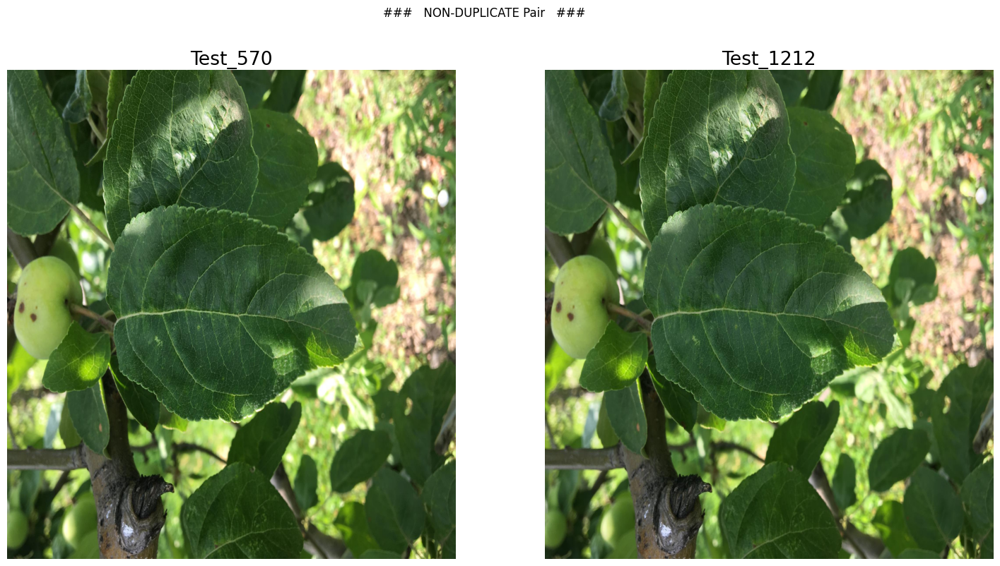

In [ ]:
with plt.style.context('seaborn-poster'):
    fig, ax = plt.subplots(nrows=1, ncols=2, figsize=(18,9), sharex=False, sharey=False)
    # Storing the images with specific path or location
    img1_path = os.path.join(all_images_loc, "Train_592.jpg")
    img2_path = os.path.join(all_images_loc, "Train_782.jpg")

    # Reading the images
    img1 = cv2.imread(img1_path)
    img1 = cv2.cvtColor(img1, cv2.COLOR_BGR2RGB)

    img2 = cv2.imread(img2_path)
    img2 = cv2.cvtColor(img2, cv2.COLOR_BGR2RGB)

    # Plotting the image-1
    ax[0].imshow(img1, aspect='auto')
    ax[0].axis("off")
    ax[0].set_title("Test_570")

    # Plotting the image-2
    ax[1].imshow(img2, aspect='auto')
    ax[1].axis("off")
    ax[1].set_title("Test_1212")


    # Figure title
    fig.suptitle("###   NON-DUPLICATE Pair   ###")

In [ ]:
print(len(all_images_names)), print(all_images_loc)

3655
/content/drive/MyDrive/apple/images/Original Dataset


(None, None)

In [ ]:
all_images_data = pd.DataFrame(all_images_names)
all_images_data.columns = ['Image_Name']
all_images_data['Image_Loc'] = all_images_loc
all_images_data

,Image_Name,Image_Loc
0,Test_1813.jpg,/content/drive/MyDrive/apple/images/Original D...
1,Test_188.jpg,/content/drive/MyDrive/apple/images/Original D...
2,Test_65.jpg,/content/drive/MyDrive/apple/images/Original D...
3,Test_673.jpg,/content/drive/MyDrive/apple/images/Original D...
4,Test_1799.jpg,/content/drive/MyDrive/apple/images/Original D...
...,...,...
3650,Train_362.jpg,/content/drive/MyDrive/apple/images/Original D...
3651,Train_361.jpg,/content/drive/MyDrive/apple/images/Original D...
3652,Train_348.jpg,/content/drive/MyDrive/apple/images/Original D...
3653,Train_371.jpg,/content/drive/MyDrive/apple/images/Original D...


In [ ]:
def read_images(image_path):
    """
    Description : This function is created for reading the images.
    """
    # Reading the image
    img = cv2.imread(image_path, -1)
    img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    # Retrieving the mean value of all the channels of an image
    red_channel = np.median(img[:,:,0])
    green_channel = np.median(img[:,:,1])
    blue_channel = np.median(img[:,:,2])
    return [red_channel, green_channel, blue_channel]


In [ ]:
all_images_data.head()

,Image_Name,Image_Loc
0,Test_1813.jpg,/content/drive/MyDrive/apple/images/Original D...
1,Test_188.jpg,/content/drive/MyDrive/apple/images/Original D...
2,Test_65.jpg,/content/drive/MyDrive/apple/images/Original D...
3,Test_673.jpg,/content/drive/MyDrive/apple/images/Original D...
4,Test_1799.jpg,/content/drive/MyDrive/apple/images/Original D...


In [ ]:
all_images_data["Mean_Channel_Values"] = all_images_data[['Image_Loc', 'Image_Name']].progress_apply(lambda row: read_images(os.path.join(row['Image_Loc'], row['Image_Name'])), axis=1)

100%|██████████| 3655/3655 [03:48<00:00, 16.02it/s]


In [ ]:
all_images_data

,Image_Name,Image_Loc,Mean_Channel_Values
0,Test_1813.jpg,/content/drive/MyDrive/apple/images/Original D...,"[94.0, 121.0, 74.0]"
1,Test_188.jpg,/content/drive/MyDrive/apple/images/Original D...,"[75.0, 128.0, 92.0]"
2,Test_65.jpg,/content/drive/MyDrive/apple/images/Original D...,"[109.0, 137.0, 80.0]"
3,Test_673.jpg,/content/drive/MyDrive/apple/images/Original D...,"[119.0, 151.0, 119.0]"
4,Test_1799.jpg,/content/drive/MyDrive/apple/images/Original D...,"[88.0, 140.0, 61.0]"
...,...,...,...
3650,Train_362.jpg,/content/drive/MyDrive/apple/images/Original D...,"[88.0, 130.0, 62.0]"
3651,Train_361.jpg,/content/drive/MyDrive/apple/images/Original D...,"[123.0, 130.0, 64.0]"
3652,Train_348.jpg,/content/drive/MyDrive/apple/images/Original D...,"[99.0, 132.0, 46.0]"
3653,Train_371.jpg,/content/drive/MyDrive/apple/images/Original D...,"[74.0, 116.0, 78.0]"


In [ ]:
rgb_vals = all_images_data['Mean_Channel_Values'].apply(pd.Series)
rgb_vals.columns = ['Red', 'Green', 'Blue']
rgb_vals

,Red,Green,Blue
0,94.0,121.0,74.0
1,75.0,128.0,92.0
2,109.0,137.0,80.0
3,119.0,151.0,119.0
4,88.0,140.0,61.0
...,...,...,...
3650,88.0,130.0,62.0
3651,123.0,130.0,64.0
3652,99.0,132.0,46.0
3653,74.0,116.0,78.0


In [ ]:
all_images_data_channels = pd.concat([all_images_data, rgb_vals], axis=1)
all_images_data_channels.drop(['Mean_Channel_Values'], axis=1, inplace=True)
all_images_data_channels.rename(columns={'Image_Name': 'image_id'}, inplace=True)
all_images_data_channels['image_id'] = all_images_data_channels['image_id'].apply(lambda val: val.split(".")[0])
all_images_data_channels

,image_id,Image_Loc,Red,Green,Blue
0,Test_1813,/content/drive/MyDrive/apple/images/Original D...,94.0,121.0,74.0
1,Test_188,/content/drive/MyDrive/apple/images/Original D...,75.0,128.0,92.0
2,Test_65,/content/drive/MyDrive/apple/images/Original D...,109.0,137.0,80.0
3,Test_673,/content/drive/MyDrive/apple/images/Original D...,119.0,151.0,119.0
4,Test_1799,/content/drive/MyDrive/apple/images/Original D...,88.0,140.0,61.0
...,...,...,...,...,...
3650,Train_362,/content/drive/MyDrive/apple/images/Original D...,88.0,130.0,62.0
3651,Train_361,/content/drive/MyDrive/apple/images/Original D...,123.0,130.0,64.0
3652,Train_348,/content/drive/MyDrive/apple/images/Original D...,99.0,132.0,46.0
3653,Train_371,/content/drive/MyDrive/apple/images/Original D...,74.0,116.0,78.0


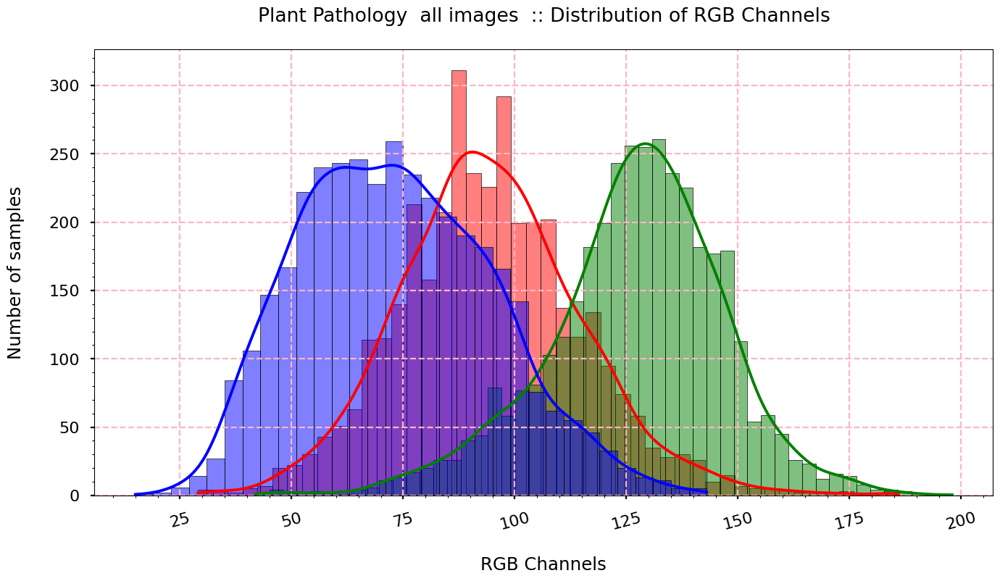

In [ ]:
# Visualizing distribution of RGB channels of ALL Images
with plt.style.context('seaborn-poster'):
    plt.figure(figsize=(16,8))
    sns.histplot(all_images_data_channels['Red'], kde=True, color='red', legend=True)
    sns.histplot(all_images_data_channels['Green'], kde=True, color='green', legend=True)
    sns.histplot(all_images_data_channels['Blue'], kde=True, color='blue', legend=True)
    # Providing the labels and title to the graph
    plt.xlabel("\nRGB Channels")
    plt.xticks(rotation=15)
    plt.ylabel("Number of samples\n")
    plt.minorticks_on()
    plt.grid(which='major', linestyle="--", color='lightpink')
    plt.title("Plant Pathology  all images  :: Distribution of RGB Channels\n")

###  ALL Images  ::  RED channel  ###  
  MIN --> 29.0  
  MAX --> 186.0  
  MEAN --> 94.52175102599179  
  MEDIAN --> 94.0
  RANGE --> 157.0

###  ALL Images  ::  GREEN channel  ###  
  MIN --> 42.0  
  MAX --> 198.0  
  MEAN --> 126.94117647058823  
  MEDIAN --> 128.0
  RANGE --> 156.0

###  ALL Images  ::  BLUE channel  ###  
  MIN --> 15.0  
  MAX --> 143.0  
  MEAN --> 73.22270861833105  
  MEDIAN --> 72.0
  RANGE --> 128.0



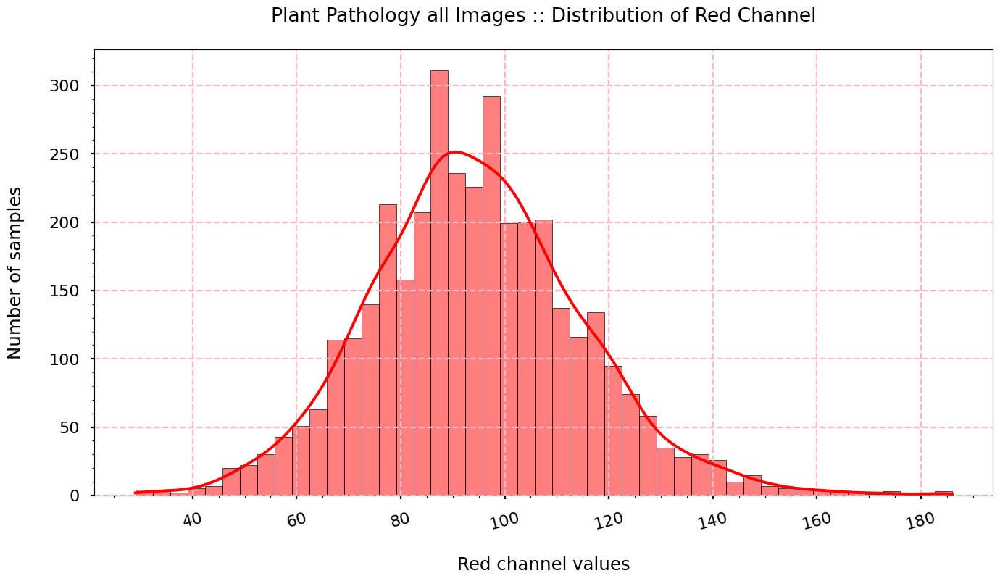

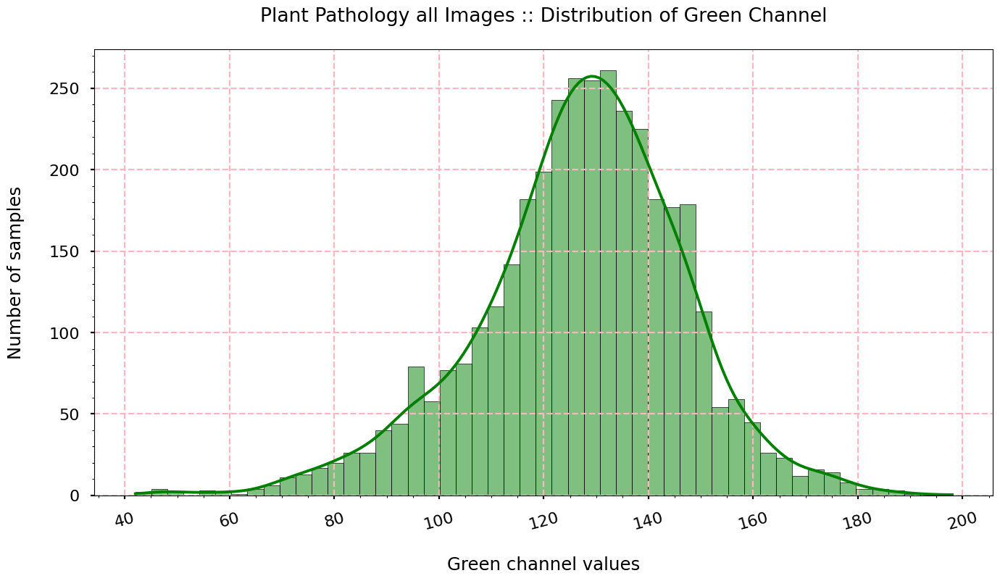

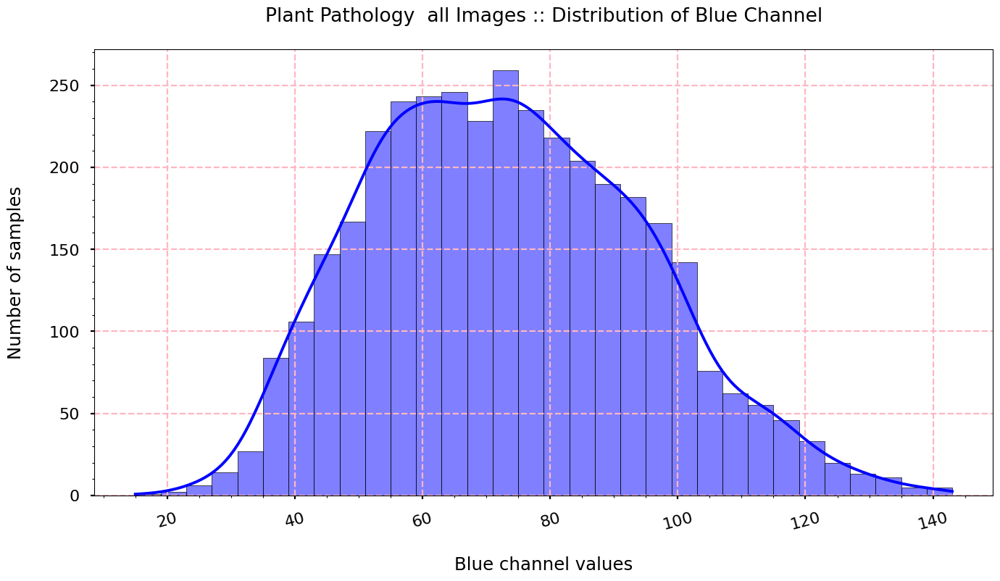

In [ ]:
# MIN, MAX, MEAN & MEDIAN of a channel
print("###  {}  ::  {} channel  ###  \n  MIN --> {}  \n  MAX --> {}  \n  MEAN --> {}  \
\n  MEDIAN --> {}\n  RANGE --> {}\n".format("ALL Images",
                                            "RED",
                                            all_images_data_channels['Red'].min(),
                                            all_images_data_channels['Red'].max(),
                                            all_images_data_channels['Red'].mean(),
                                            all_images_data_channels['Red'].median(),
                                            (all_images_data_channels['Red'].max() - all_images_data_channels['Red'].min())))

# Visualizing only RED channel
with plt.style.context('seaborn-poster'):
    plt.figure(figsize=(16,8))
    sns.histplot(all_images_data_channels['Red'], kde=True, color='red', legend=True)
    # Providing the labels and title to the graph
    plt.xlabel("\nRed channel values")
    plt.xticks(rotation=15)
    plt.ylabel("Number of samples\n")
    plt.minorticks_on()
    plt.grid(which='major', linestyle="--", color='lightpink')
    plt.title("Plant Pathology all Images :: Distribution of Red Channel\n")
# MIN, MAX, MEAN & MEDIAN of a channel
print("###  {}  ::  {} channel  ###  \n  MIN --> {}  \n  MAX --> {}  \n  MEAN --> {}  \
\n  MEDIAN --> {}\n  RANGE --> {}\n".format("ALL Images",
                                            "GREEN",
                                            all_images_data_channels['Green'].min(),
                                            all_images_data_channels['Green'].max(),
                                            all_images_data_channels['Green'].mean(),
                                            all_images_data_channels['Green'].median(),
                                            (all_images_data_channels['Green'].max() - all_images_data_channels['Green'].min())))

# Visualizing only GREEN channel
with plt.style.context('seaborn-poster'):
    plt.figure(figsize=(16,8))
    sns.histplot(all_images_data_channels['Green'], kde=True, color='green', legend=True)
    # Providing the labels and title to the graph
    plt.xlabel("\nGreen channel values")
    plt.xticks(rotation=15)
    plt.ylabel("Number of samples\n")
    plt.minorticks_on()
    plt.grid(which='major', linestyle="--", color='lightpink')
    plt.title("Plant Pathology all Images :: Distribution of Green Channel\n")
# MIN, MAX, MEAN & MEDIAN of a channel
print("###  {}  ::  {} channel  ###  \n  MIN --> {}  \n  MAX --> {}  \n  MEAN --> {}  \
\n  MEDIAN --> {}\n  RANGE --> {}\n".format("ALL Images",
                                            "BLUE",
                                            all_images_data_channels['Blue'].min(),
                                            all_images_data_channels['Blue'].max(),
                                            all_images_data_channels['Blue'].mean(),
                                            all_images_data_channels['Blue'].median(),
                                            (all_images_data_channels['Blue'].max() - all_images_data_channels['Blue'].min())))

# Visualizing only BLUE channel
with plt.style.context('seaborn-poster'):
    plt.figure(figsize=(16,8))
    sns.histplot(all_images_data_channels['Blue'], kde=True, color='blue', legend=True)
    # Providing the labels and title to the graph
    plt.xlabel("\nBlue channel values")
    plt.xticks(rotation=15)
    plt.ylabel("Number of samples\n")
    plt.minorticks_on()
    plt.grid(which='major', linestyle="--", color='lightpink')
    plt.title("Plant Pathology  all Images :: Distribution of Blue Channel\n")

In [ ]:
# Displaying the statistics related to every channel
## MIN, MAX, MEAN & MEDIAN of RGB channels of all images
cols = ['MIN', 'MAX', 'MEAN', 'MEDIAN', "RANGE", "STDDEV"]

all_img_red_sts = pd.DataFrame([all_images_data_channels['Red'].min(), all_images_data_channels['Red'].max(),
                                np.round(all_images_data_channels['Red'].mean(),1), all_images_data_channels['Red'].median(),
                                (all_images_data_channels['Red'].max() - all_images_data_channels['Red'].min()),
                                np.std(all_images_data_channels['Red'])]).T
all_img_red_sts.columns = cols

all_img_green_sts = pd.DataFrame([all_images_data_channels['Green'].min(), all_images_data_channels['Green'].max(),
                                  np.round(all_images_data_channels['Green'].mean(),1), all_images_data_channels['Green'].median(),
                                 (all_images_data_channels['Green'].max() - all_images_data_channels['Green'].min()),
                                 np.std(all_images_data_channels['Green'])]).T
all_img_green_sts.columns = cols

all_img_blue_sts = pd.DataFrame([all_images_data_channels['Blue'].min(), all_images_data_channels['Blue'].max(),
                                 np.round(all_images_data_channels['Blue'].mean(),1), all_images_data_channels['Blue'].median(),
                                (all_images_data_channels['Blue'].max() - all_images_data_channels['Blue'].min()),
                                np.std(all_images_data_channels['Blue'])]).T
all_img_blue_sts.columns = cols
all_img_rgb_sts = pd.concat([all_img_red_sts, all_img_green_sts, all_img_blue_sts], axis=0)
all_img_rgb_sts.index = ["RED", "GREEN", "BLUE"]
all_img_rgb_sts

,MIN,MAX,MEAN,MEDIAN,RANGE,STDDEV
RED,29.0,186.0,94.5,94.0,157.0,20.537577
GREEN,42.0,198.0,126.9,128.0,156.0,19.909084
BLUE,15.0,143.0,73.2,72.0,128.0,21.456250


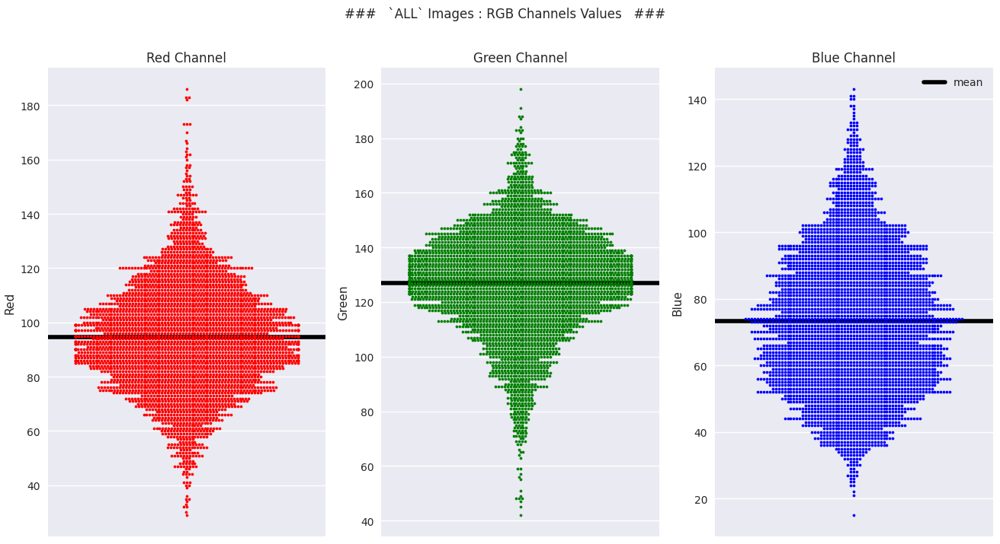

In [ ]:
# Visualizing the RGB channels values of all images
with plt.style.context('seaborn'):
        fig, ax = plt.subplots(nrows=1, ncols=3, figsize=(16,8), sharex=False, sharey=False)
        # Plotting the RED Channel
        sns.swarmplot(data=all_images_data_channels['Red'], color='red', size=2.7, ax=ax[0])
        ax[0].axhline(y=all_images_data_channels['Red'].mean(), color='black', linewidth=4, label='mean')
        ax[0].set_title("Red Channel")

        # Plotting the Green Channel
        sns.swarmplot(data=all_images_data_channels['Green'], color='green', size=2.7, ax=ax[1])
        ax[1].axhline(y=all_images_data_channels['Green'].mean(), color='black', linewidth=4, label='mean')
        ax[1].set_title("Green Channel")

        # Plotting the Blue Channel
        sns.swarmplot(data=all_images_data_channels['Blue'], color='blue', size=2.7, ax=ax[2])
        ax[2].axhline(y=all_images_data_channels['Blue'].mean(), color='black', linewidth=4, label='mean')
        ax[2].set_title("Blue Channel")

        fig.suptitle("###   `ALL` Images : RGB Channels Values   ###")
        plt.legend()

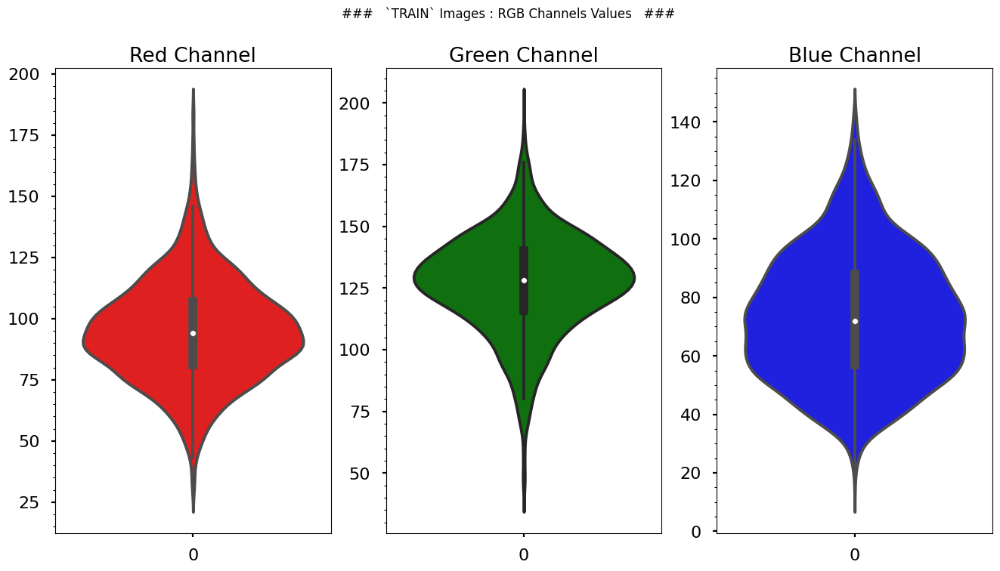

In [ ]:
with plt.style.context('seaborn-poster'):
        fig, ax = plt.subplots(nrows=1, ncols=3, figsize=(16,8), sharex=False, sharey=False)
        # Plotting the RED Channel
        sns.violinplot(data=all_images_data_channels['Red'], color='red', ax=ax[0])
        ax[0].set_title("Red Channel")
        ax[0].minorticks_on()

        # Plotting the Green Channel
        sns.violinplot(data=all_images_data_channels['Green'], color='green', ax=ax[1])
        ax[1].set_title("Green Channel")
        ax[1].minorticks_on()

        # Plotting the Blue Channel
        sns.violinplot(data=all_images_data_channels['Blue'], color='blue', ax=ax[2])
        ax[2].set_title("Blue Channel")
        ax[2].minorticks_on()

        fig.suptitle("###   `TRAIN` Images : RGB Channels Values   ###")

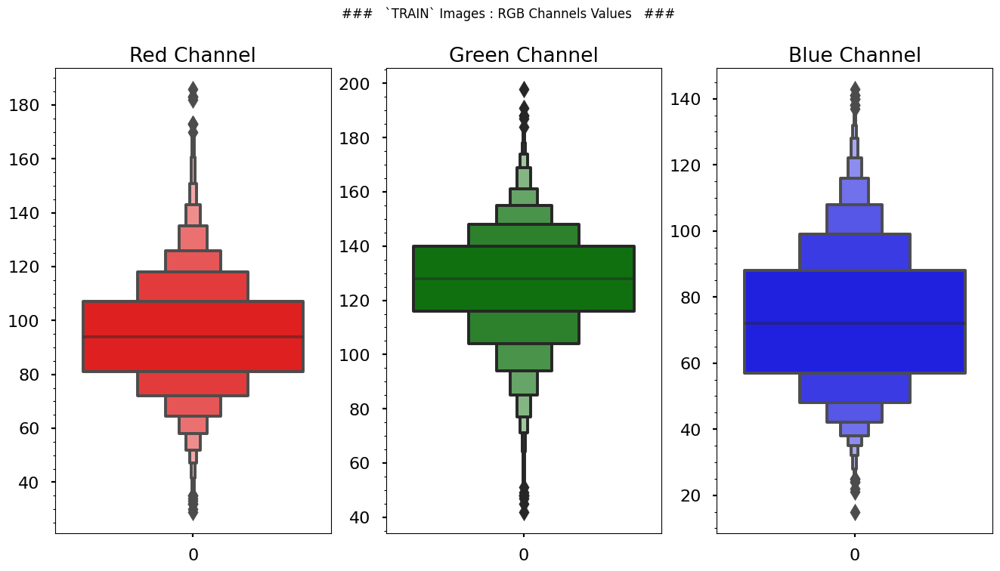

In [ ]:
with plt.style.context('seaborn-poster'):
        fig, ax = plt.subplots(nrows=1, ncols=3, figsize=(16,8), sharex=False, sharey=False)
        # Plotting the RED Channel
        sns.boxenplot(data=all_images_data_channels['Red'], color='red', ax=ax[0])
        ax[0].set_title("Red Channel")
        ax[0].minorticks_on()

        # Plotting the Green Channel
        sns.boxenplot(data=all_images_data_channels['Green'], color='green', ax=ax[1])
        ax[1].set_title("Green Channel")
        ax[1].minorticks_on()

        # Plotting the Blue Channel
        sns.boxenplot(data=all_images_data_channels['Blue'], color='blue', ax=ax[2])
        ax[2].set_title("Blue Channel")
        ax[2].minorticks_on()

        fig.suptitle("###   `TRAIN` Images : RGB Channels Values   ###")

In [ ]:
train_img_chnl_data_tgts = pd.merge(left=all_images_data_channels, right=train, on='image_id')
train_img_chnl_data_tgts

,image_id,Image_Loc,Red,Green,Blue,healthy,multiple_diseases,rust,scab
0,Train_1772,/content/drive/MyDrive/apple/images/Original D...,68.0,98.0,29.0,0,0,1,0
1,Train_1766,/content/drive/MyDrive/apple/images/Original D...,97.0,144.0,57.0,0,0,1,0
2,Train_1763,/content/drive/MyDrive/apple/images/Original D...,101.0,130.0,48.0,0,0,1,0
3,Train_1765,/content/drive/MyDrive/apple/images/Original D...,44.0,69.0,30.0,0,0,0,1
4,Train_1764,/content/drive/MyDrive/apple/images/Original D...,97.0,134.0,38.0,0,0,1,0
...,...,...,...,...,...,...,...,...,...
1816,Train_362,/content/drive/MyDrive/apple/images/Original D...,88.0,130.0,62.0,0,0,0,1
1817,Train_361,/content/drive/MyDrive/apple/images/Original D...,123.0,130.0,64.0,0,0,0,1
1818,Train_348,/content/drive/MyDrive/apple/images/Original D...,99.0,132.0,46.0,1,0,0,0
1819,Train_371,/content/drive/MyDrive/apple/images/Original D...,74.0,116.0,78.0,0,0,1,0


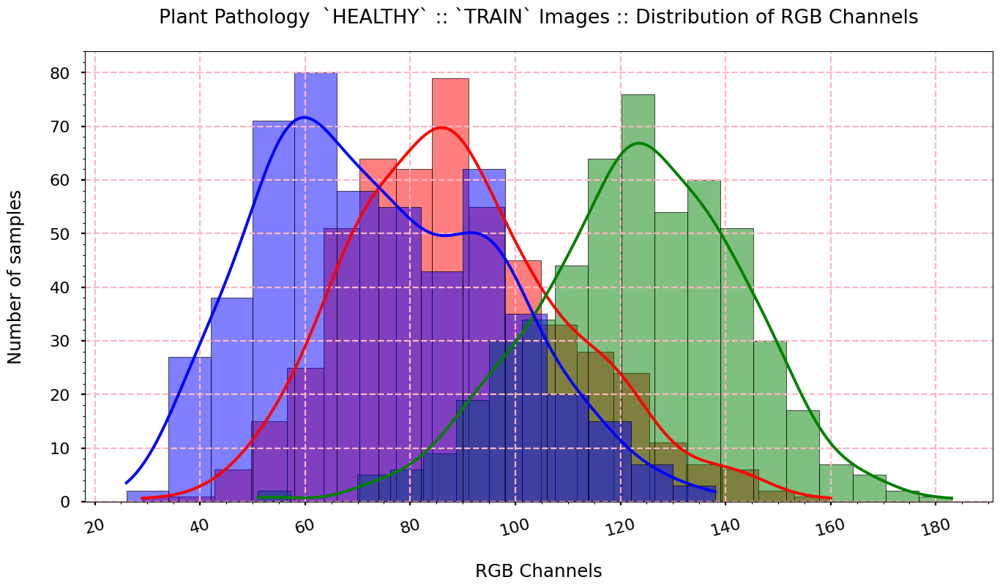

In [ ]:

# Visualizing distribution of RGB channels of HEALTHY :: TRAIN Images
with plt.style.context('seaborn-poster'):
    plt.figure(figsize=(16,8))
    sns.histplot(train_img_chnl_data_tgts[train_img_chnl_data_tgts['healthy'] == 1]['Red'], kde=True, color='red', legend=True)
    sns.histplot(train_img_chnl_data_tgts[train_img_chnl_data_tgts['healthy'] == 1]['Green'], kde=True, color='green', legend=True)
    sns.histplot(train_img_chnl_data_tgts[train_img_chnl_data_tgts['healthy'] == 1]['Blue'], kde=True, color='blue', legend=True)
    # Providing the labels and title to the graph
    plt.xlabel("\nRGB Channels")
    plt.xticks(rotation=15)
    plt.ylabel("Number of samples\n")
    plt.minorticks_on()
    plt.grid(which='major', linestyle="--", color='lightpink')
    plt.title("Plant Pathology  `HEALTHY` :: `TRAIN` Images :: Distribution of RGB Channels\n")


###  ALL Images  ::  RED channel  ###  
  MIN --> 29.0  
  MAX --> 160.0  
  MEAN --> 88.97868217054264  
  MEDIAN --> 87.0
  RANGE --> 131.0

###  ALL Images  ::  GREEN channel  ###  
  MIN --> 51.0  
  MAX --> 183.0  
  MEAN --> 123.33720930232558  
  MEDIAN --> 124.0
  RANGE --> 132.0

###  ALL Images  ::  BLUE channel  ###  
  MIN --> 26.0  
  MAX --> 138.0  
  MEAN --> 73.88372093023256  
  MEDIAN --> 71.0
  RANGE --> 112.0



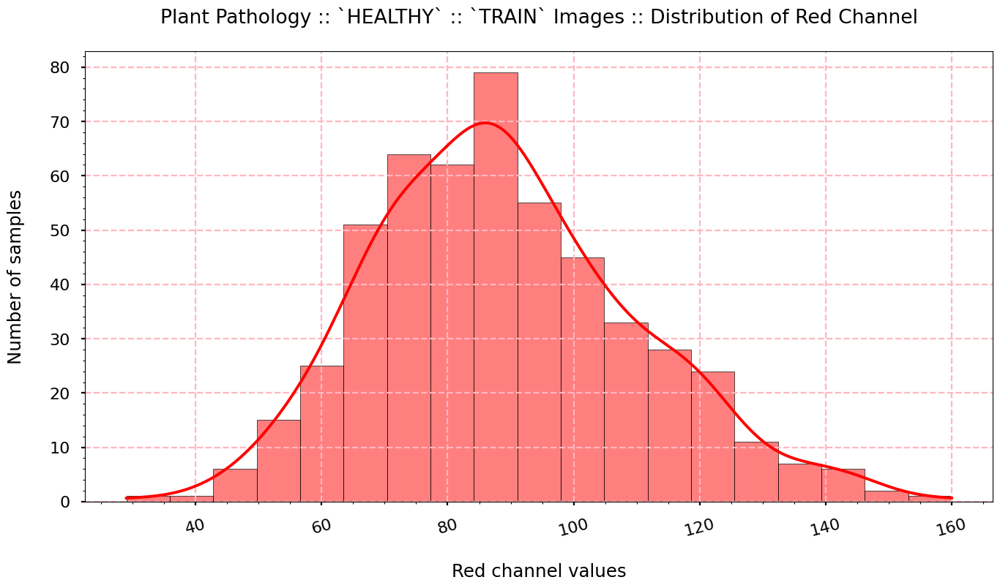

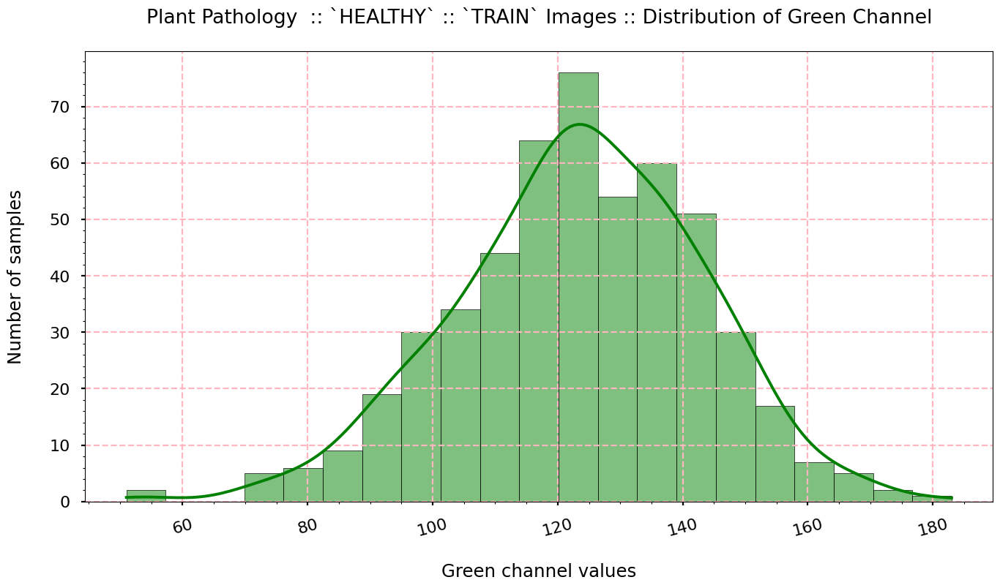

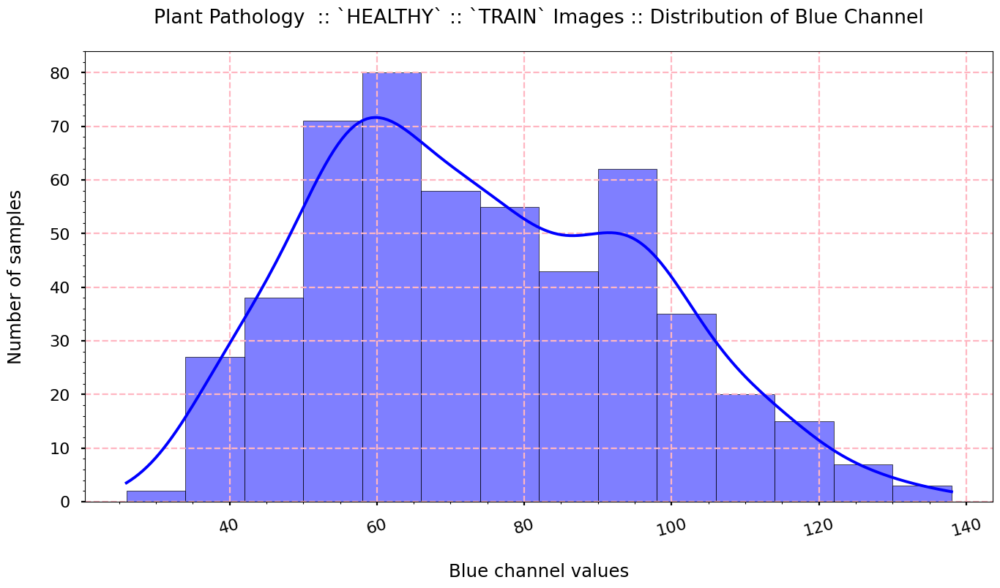

In [ ]:
# MIN, MAX, MEAN & MEDIAN of a channel
print("###  {}  ::  {} channel  ###  \n  MIN --> {}  \n  MAX --> {}  \n  MEAN --> {}  \
\n  MEDIAN --> {}\n  RANGE --> {}\n".format("ALL Images",
                                            "RED",
                                            train_img_chnl_data_tgts[train_img_chnl_data_tgts['healthy'] == 1]['Red'].min(),
                                            train_img_chnl_data_tgts[train_img_chnl_data_tgts['healthy'] == 1]['Red'].max(),
                                            train_img_chnl_data_tgts[train_img_chnl_data_tgts['healthy'] == 1]['Red'].mean(),
                                            train_img_chnl_data_tgts[train_img_chnl_data_tgts['healthy'] == 1]['Red'].median(),
                                            (train_img_chnl_data_tgts[train_img_chnl_data_tgts['healthy'] == 1]['Red'].max() - train_img_chnl_data_tgts[train_img_chnl_data_tgts['healthy'] == 1]['Red'].min())))

# Visualizing only RED channel
with plt.style.context('seaborn-poster'):
    plt.figure(figsize=(16,8))
    sns.histplot(train_img_chnl_data_tgts[train_img_chnl_data_tgts['healthy'] == 1]['Red'], kde=True, color='red', legend=True)
    # Providing the labels and title to the graph
    plt.xlabel("\nRed channel values")
    plt.xticks(rotation=15)
    plt.ylabel("Number of samples\n")
    plt.minorticks_on()
    plt.grid(which='major', linestyle="--", color='lightpink')
    plt.title("Plant Pathology :: `HEALTHY` :: `TRAIN` Images :: Distribution of Red Channel\n")
# MIN, MAX, MEAN & MEDIAN of a channel
print("###  {}  ::  {} channel  ###  \n  MIN --> {}  \n  MAX --> {}  \n  MEAN --> {}  \
\n  MEDIAN --> {}\n  RANGE --> {}\n".format("ALL Images",
                                            "GREEN",
                                            train_img_chnl_data_tgts[train_img_chnl_data_tgts['healthy'] == 1]['Green'].min(),
                                            train_img_chnl_data_tgts[train_img_chnl_data_tgts['healthy'] == 1]['Green'].max(),
                                            train_img_chnl_data_tgts[train_img_chnl_data_tgts['healthy'] == 1]['Green'].mean(),
                                            train_img_chnl_data_tgts[train_img_chnl_data_tgts['healthy'] == 1]['Green'].median(),
                                            (train_img_chnl_data_tgts[train_img_chnl_data_tgts['healthy'] == 1]['Green'].max() - train_img_chnl_data_tgts[train_img_chnl_data_tgts['healthy'] == 1]['Green'].min())))

# Visualizing only GREEN channel
with plt.style.context('seaborn-poster'):
    plt.figure(figsize=(16,8))
    sns.histplot(train_img_chnl_data_tgts[train_img_chnl_data_tgts['healthy'] == 1]['Green'], kde=True, color='green', legend=True)
    # Providing the labels and title to the graph
    plt.xlabel("\nGreen channel values")
    plt.xticks(rotation=15)
    plt.ylabel("Number of samples\n")
    plt.minorticks_on()
    plt.grid(which='major', linestyle="--", color='lightpink')
    plt.title("Plant Pathology  :: `HEALTHY` :: `TRAIN` Images :: Distribution of Green Channel\n")
# MIN, MAX, MEAN & MEDIAN of a channel
print("###  {}  ::  {} channel  ###  \n  MIN --> {}  \n  MAX --> {}  \n  MEAN --> {}  \
\n  MEDIAN --> {}\n  RANGE --> {}\n".format("ALL Images",
                                            "BLUE",
                                            train_img_chnl_data_tgts[train_img_chnl_data_tgts['healthy'] == 1]['Blue'].min(),
                                            train_img_chnl_data_tgts[train_img_chnl_data_tgts['healthy'] == 1]['Blue'].max(),
                                            train_img_chnl_data_tgts[train_img_chnl_data_tgts['healthy'] == 1]['Blue'].mean(),
                                            train_img_chnl_data_tgts[train_img_chnl_data_tgts['healthy'] == 1]['Blue'].median(),
                                            (train_img_chnl_data_tgts[train_img_chnl_data_tgts['healthy'] == 1]['Blue'].max() - train_img_chnl_data_tgts[train_img_chnl_data_tgts['healthy'] == 1]['Blue'].min())))

# Visualizing only BLUE channel
with plt.style.context('seaborn-poster'):
    plt.figure(figsize=(16,8))
    sns.histplot(train_img_chnl_data_tgts[train_img_chnl_data_tgts['healthy'] == 1]['Blue'], kde=True, color='blue', legend=True)
    # Providing the labels and title to the graph
    plt.xlabel("\nBlue channel values")
    plt.xticks(rotation=15)
    plt.ylabel("Number of samples\n")
    plt.minorticks_on()
    plt.grid(which='major', linestyle="--", color='lightpink')
    plt.title("Plant Pathology  :: `HEALTHY` :: `TRAIN` Images :: Distribution of Blue Channel\n")

In [ ]:
# Displaying the statistics related to every channel
## MIN, MAX, MEAN & MEDIAN of RGB channels of HEALTHY TRAIN images
cols = ['MIN', 'MAX', 'MEAN', 'MEDIAN', "RANGE", "STDDEV"]

tr_img_red_sts = pd.DataFrame([train_img_chnl_data_tgts[train_img_chnl_data_tgts['healthy'] == 1]['Red'].min(),
                                train_img_chnl_data_tgts[train_img_chnl_data_tgts['healthy'] == 1]['Red'].max(),
                                np.round(train_img_chnl_data_tgts[train_img_chnl_data_tgts['healthy'] == 1]['Red'].mean(),1),
                                train_img_chnl_data_tgts[train_img_chnl_data_tgts['healthy'] == 1]['Red'].median(),
                                (train_img_chnl_data_tgts[train_img_chnl_data_tgts['healthy'] == 1]['Red'].max() - train_img_chnl_data_tgts[train_img_chnl_data_tgts['healthy'] == 1]['Red'].min()),
                                np.std(train_img_chnl_data_tgts[train_img_chnl_data_tgts['healthy'] == 1]['Red'])]).T
tr_img_red_sts.columns = cols

tr_img_green_sts = pd.DataFrame([train_img_chnl_data_tgts[train_img_chnl_data_tgts['healthy'] == 1]['Green'].min(),
                                 train_img_chnl_data_tgts[train_img_chnl_data_tgts['healthy'] == 1]['Green'].max(),
                                  np.round(train_img_chnl_data_tgts[train_img_chnl_data_tgts['healthy'] == 1]['Green'].mean(),1),
                                 train_img_chnl_data_tgts[train_img_chnl_data_tgts['healthy'] == 1]['Green'].median(),
                                 (train_img_chnl_data_tgts[train_img_chnl_data_tgts['healthy'] == 1]['Green'].max() - train_img_chnl_data_tgts[train_img_chnl_data_tgts['healthy'] == 1]['Green'].min()),
                                 np.std(train_img_chnl_data_tgts[train_img_chnl_data_tgts['healthy'] == 1]['Green'])]).T
tr_img_green_sts.columns = cols
tr_img_blue_sts = pd.DataFrame([train_img_chnl_data_tgts[train_img_chnl_data_tgts['healthy'] == 1]['Blue'].min(),
                                train_img_chnl_data_tgts[train_img_chnl_data_tgts['healthy'] == 1]['Blue'].max(),
                                 np.round(train_img_chnl_data_tgts[train_img_chnl_data_tgts['healthy'] == 1]['Blue'].mean(),1),
                                train_img_chnl_data_tgts[train_img_chnl_data_tgts['healthy'] == 1]['Blue'].median(),
                                (train_img_chnl_data_tgts[train_img_chnl_data_tgts['healthy'] == 1]['Blue'].max() - train_img_chnl_data_tgts[train_img_chnl_data_tgts['healthy'] == 1]['Blue'].min()),
                                np.std(train_img_chnl_data_tgts[train_img_chnl_data_tgts['healthy'] == 1]['Blue'])]).T
tr_img_blue_sts.columns = cols

tr_img_rgb_sts = pd.concat([tr_img_red_sts, tr_img_green_sts, tr_img_blue_sts], axis=0)
tr_img_rgb_sts.index = ["RED", "GREEN", "BLUE"]
tr_img_rgb_sts

,MIN,MAX,MEAN,MEDIAN,RANGE,STDDEV
RED,29.0,160.0,89.0,87.0,131.0,20.992744
GREEN,51.0,183.0,123.3,124.0,132.0,19.693353
BLUE,26.0,138.0,73.9,71.0,112.0,22.037715


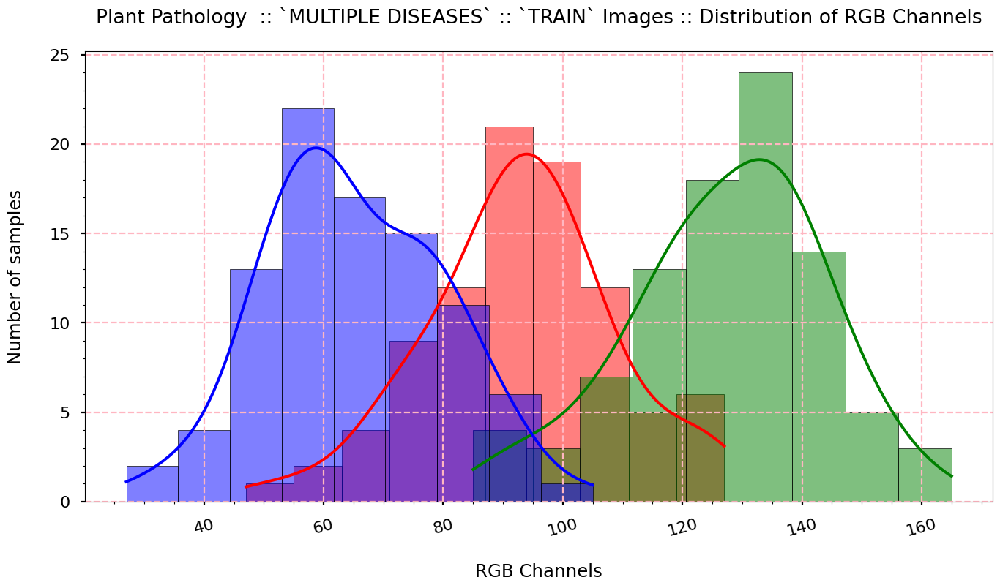

In [ ]:
# Visualizing distribution of RGB channels of MULTIPLE DISEASE :: TRAIN Images
with plt.style.context('seaborn-poster'):
    plt.figure(figsize=(16,8))
    sns.histplot(train_img_chnl_data_tgts[train_img_chnl_data_tgts['multiple_diseases'] == 1]['Red'], kde=True, color='red', legend=True)
    sns.histplot(train_img_chnl_data_tgts[train_img_chnl_data_tgts['multiple_diseases'] == 1]['Green'], kde=True, color='green', legend=True)
    sns.histplot(train_img_chnl_data_tgts[train_img_chnl_data_tgts['multiple_diseases'] == 1]['Blue'], kde=True, color='blue', legend=True)
    # Providing the labels and title to the graph
    plt.xlabel("\nRGB Channels")
    plt.xticks(rotation=15)
    plt.ylabel("Number of samples\n")
    plt.minorticks_on()
    plt.grid(which='major', linestyle="--", color='lightpink')
    plt.title("Plant Pathology  :: `MULTIPLE DISEASES` :: `TRAIN` Images :: Distribution of RGB Channels\n")

###  ALL Images  ::  RED channel  ###  
  MIN --> 47.0  
  MAX --> 127.0  
  MEAN --> 92.9010989010989  
  MEDIAN --> 93.0
  RANGE --> 80.0

###  ALL Images  ::  GREEN channel  ###  
  MIN --> 85.0  
  MAX --> 165.0  
  MEAN --> 127.43956043956044  
  MEDIAN --> 130.0
  RANGE --> 80.0

###  ALL Images  ::  BLUE channel  ###  
  MIN --> 27.0  
  MAX --> 105.0  
  MEAN --> 65.0989010989011  
  MEDIAN --> 62.0
  RANGE --> 78.0



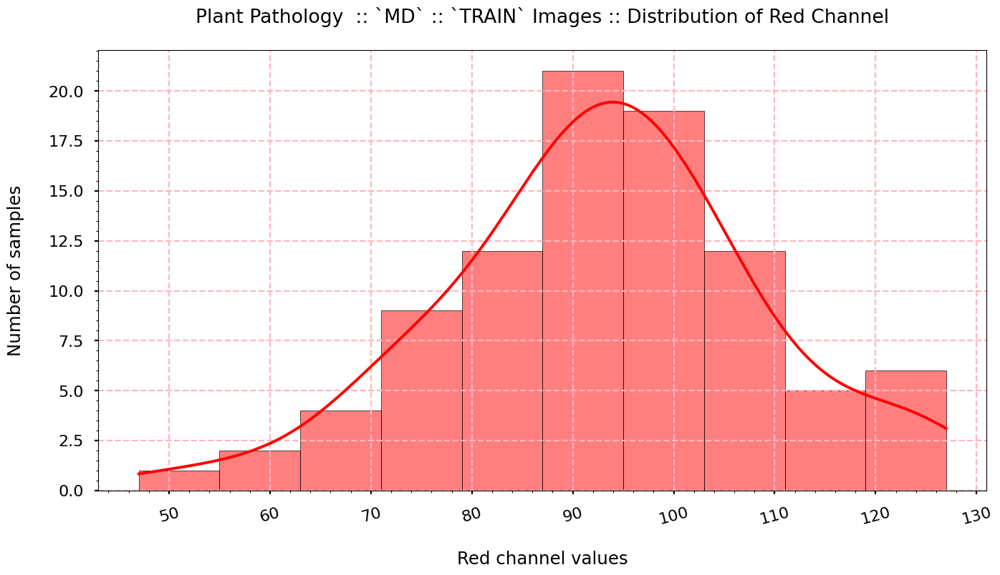

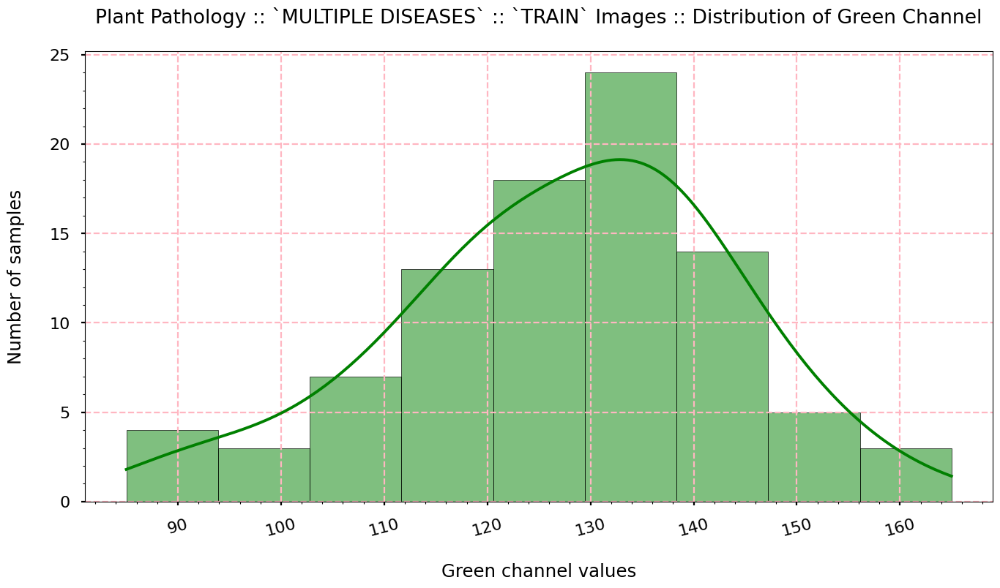

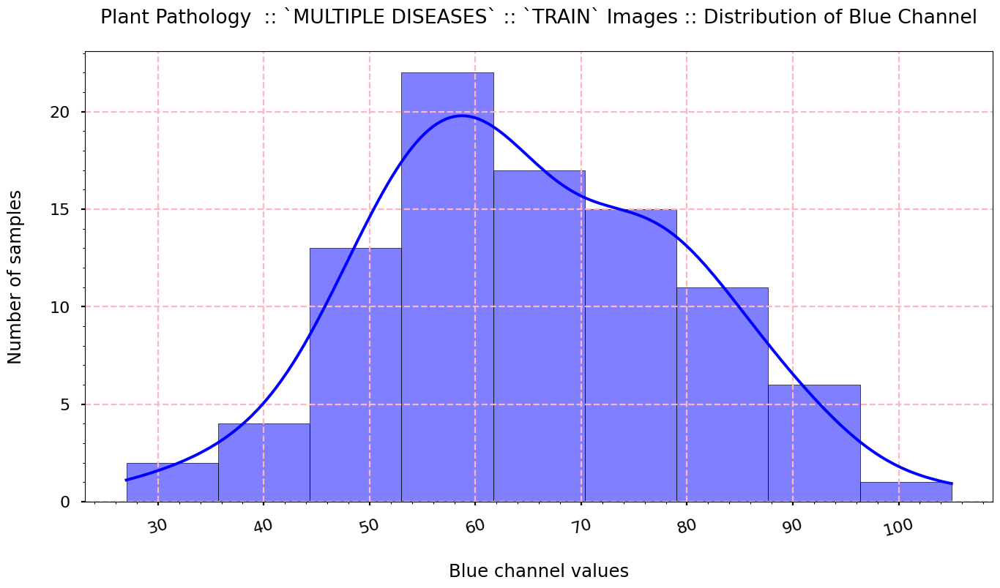

In [ ]:
# MIN, MAX, MEAN & MEDIAN of a channel
print("###  {}  ::  {} channel  ###  \n  MIN --> {}  \n  MAX --> {}  \n  MEAN --> {}  \
\n  MEDIAN --> {}\n  RANGE --> {}\n".format("ALL Images",
                                            "RED",
                                            train_img_chnl_data_tgts[train_img_chnl_data_tgts['multiple_diseases'] == 1]['Red'].min(),
                                            train_img_chnl_data_tgts[train_img_chnl_data_tgts['multiple_diseases'] == 1]['Red'].max(),
                                            train_img_chnl_data_tgts[train_img_chnl_data_tgts['multiple_diseases'] == 1]['Red'].mean(),
                                            train_img_chnl_data_tgts[train_img_chnl_data_tgts['multiple_diseases'] == 1]['Red'].median(),
                                            (train_img_chnl_data_tgts[train_img_chnl_data_tgts['multiple_diseases'] == 1]['Red'].max() - train_img_chnl_data_tgts[train_img_chnl_data_tgts['multiple_diseases'] == 1]['Red'].min())))

# Visualizing only RED channel
with plt.style.context('seaborn-poster'):
    plt.figure(figsize=(16,8))
    sns.histplot(train_img_chnl_data_tgts[train_img_chnl_data_tgts['multiple_diseases'] == 1]['Red'], kde=True, color='red', legend=True)
    # Providing the labels and title to the graph
    plt.xlabel("\nRed channel values")
    plt.xticks(rotation=15)
    plt.ylabel("Number of samples\n")
    plt.minorticks_on()
    plt.grid(which='major', linestyle="--", color='lightpink')
    plt.title("Plant Pathology  :: `MD` :: `TRAIN` Images :: Distribution of Red Channel\n")
# MIN, MAX, MEAN & MEDIAN of a channel
print("###  {}  ::  {} channel  ###  \n  MIN --> {}  \n  MAX --> {}  \n  MEAN --> {}  \
\n  MEDIAN --> {}\n  RANGE --> {}\n".format("ALL Images",
                                            "GREEN",
                                            train_img_chnl_data_tgts[train_img_chnl_data_tgts['multiple_diseases'] == 1]['Green'].min(),
                                            train_img_chnl_data_tgts[train_img_chnl_data_tgts['multiple_diseases'] == 1]['Green'].max(),
                                            train_img_chnl_data_tgts[train_img_chnl_data_tgts['multiple_diseases'] == 1]['Green'].mean(),
                                            train_img_chnl_data_tgts[train_img_chnl_data_tgts['multiple_diseases'] == 1]['Green'].median(),
                                            (train_img_chnl_data_tgts[train_img_chnl_data_tgts['multiple_diseases'] == 1]['Green'].max() - train_img_chnl_data_tgts[train_img_chnl_data_tgts['multiple_diseases'] == 1]['Green'].min())))

# Visualizing only GREEN channel
with plt.style.context('seaborn-poster'):
    plt.figure(figsize=(16,8))
    sns.histplot(train_img_chnl_data_tgts[train_img_chnl_data_tgts['multiple_diseases'] == 1]['Green'], kde=True, color='green', legend=True)
    # Providing the labels and title to the graph
    plt.xlabel("\nGreen channel values")
    plt.xticks(rotation=15)
    plt.ylabel("Number of samples\n")
    plt.minorticks_on()
    plt.grid(which='major', linestyle="--", color='lightpink')
    plt.title("Plant Pathology :: `MULTIPLE DISEASES` :: `TRAIN` Images :: Distribution of Green Channel\n")
# MIN, MAX, MEAN & MEDIAN of a channel
print("###  {}  ::  {} channel  ###  \n  MIN --> {}  \n  MAX --> {}  \n  MEAN --> {}  \
\n  MEDIAN --> {}\n  RANGE --> {}\n".format("ALL Images",
                                            "BLUE",
                                            train_img_chnl_data_tgts[train_img_chnl_data_tgts['multiple_diseases'] == 1]['Blue'].min(),
                                            train_img_chnl_data_tgts[train_img_chnl_data_tgts['multiple_diseases'] == 1]['Blue'].max(),
                                            train_img_chnl_data_tgts[train_img_chnl_data_tgts['multiple_diseases'] == 1]['Blue'].mean(),
                                            train_img_chnl_data_tgts[train_img_chnl_data_tgts['multiple_diseases'] == 1]['Blue'].median(),
                                            (train_img_chnl_data_tgts[train_img_chnl_data_tgts['multiple_diseases'] == 1]['Blue'].max() - train_img_chnl_data_tgts[train_img_chnl_data_tgts['multiple_diseases'] == 1]['Blue'].min())))

# Visualizing only BLUE channel
with plt.style.context('seaborn-poster'):
    plt.figure(figsize=(16,8))
    sns.histplot(train_img_chnl_data_tgts[train_img_chnl_data_tgts['multiple_diseases'] == 1]['Blue'], kde=True, color='blue', legend=True)
    # Providing the labels and title to the graph
    plt.xlabel("\nBlue channel values")
    plt.xticks(rotation=15)
    plt.ylabel("Number of samples\n")
    plt.minorticks_on()
    plt.grid(which='major', linestyle="--", color='lightpink')
    plt.title("Plant Pathology  :: `MULTIPLE DISEASES` :: `TRAIN` Images :: Distribution of Blue Channel\n")

In [ ]:
# Displaying the statistics related to every channel
## MIN, MAX, MEAN & MEDIAN of RGB channels of only MD :: TRAIN images
cols = ['MIN', 'MAX', 'MEAN', 'MEDIAN', "RANGE", "STDDEV"]

tr_img_red_sts2 = pd.DataFrame([train_img_chnl_data_tgts[train_img_chnl_data_tgts['multiple_diseases'] == 1]['Red'].min(),
                                train_img_chnl_data_tgts[train_img_chnl_data_tgts['multiple_diseases'] == 1]['Red'].max(),
                                np.round(train_img_chnl_data_tgts[train_img_chnl_data_tgts['multiple_diseases'] == 1]['Red'].mean(),1),
                                train_img_chnl_data_tgts[train_img_chnl_data_tgts['multiple_diseases'] == 1]['Red'].median(),
                                (train_img_chnl_data_tgts[train_img_chnl_data_tgts['multiple_diseases'] == 1]['Red'].max() - train_img_chnl_data_tgts[train_img_chnl_data_tgts['multiple_diseases'] == 1]['Red'].min()),
                                np.std(train_img_chnl_data_tgts[train_img_chnl_data_tgts['multiple_diseases'] == 1]['Red'])]).T
tr_img_red_sts2.columns = cols

tr_img_green_sts2 = pd.DataFrame([train_img_chnl_data_tgts[train_img_chnl_data_tgts['multiple_diseases'] == 1]['Green'].min(),
                                 train_img_chnl_data_tgts[train_img_chnl_data_tgts['multiple_diseases'] == 1]['Green'].max(),
                                  np.round(train_img_chnl_data_tgts[train_img_chnl_data_tgts['multiple_diseases'] == 1]['Green'].mean(),1),
                                 train_img_chnl_data_tgts[train_img_chnl_data_tgts['multiple_diseases'] == 1]['Green'].median(),
                                 (train_img_chnl_data_tgts[train_img_chnl_data_tgts['multiple_diseases'] == 1]['Green'].max() - train_img_chnl_data_tgts[train_img_chnl_data_tgts['multiple_diseases'] == 1]['Green'].min()),
                                 np.std(train_img_chnl_data_tgts[train_img_chnl_data_tgts['multiple_diseases'] == 1]['Green'])]).T
tr_img_green_sts2.columns = cols
tr_img_blue_sts2 = pd.DataFrame([train_img_chnl_data_tgts[train_img_chnl_data_tgts['multiple_diseases'] == 1]['Blue'].min(),
                                train_img_chnl_data_tgts[train_img_chnl_data_tgts['multiple_diseases'] == 1]['Blue'].max(),
                                 np.round(train_img_chnl_data_tgts[train_img_chnl_data_tgts['multiple_diseases'] == 1]['Blue'].mean(),1),
                                train_img_chnl_data_tgts[train_img_chnl_data_tgts['multiple_diseases'] == 1]['Blue'].median(),
                                (train_img_chnl_data_tgts[train_img_chnl_data_tgts['multiple_diseases'] == 1]['Blue'].max() - train_img_chnl_data_tgts[train_img_chnl_data_tgts['multiple_diseases'] == 1]['Blue'].min()),
                                np.std(train_img_chnl_data_tgts[train_img_chnl_data_tgts['multiple_diseases'] == 1]['Blue'])]).T
tr_img_blue_sts2.columns = cols

tr_img_rgb_sts2 = pd.concat([tr_img_red_sts2, tr_img_green_sts2, tr_img_blue_sts2], axis=0)
tr_img_rgb_sts2.index = ["RED", "GREEN", "BLUE"]
tr_img_rgb_sts2

,MIN,MAX,MEAN,MEDIAN,RANGE,STDDEV
RED,47.0,127.0,92.9,93.0,80.0,15.719418
GREEN,85.0,165.0,127.4,130.0,80.0,16.196058
BLUE,27.0,105.0,65.1,62.0,78.0,14.841326


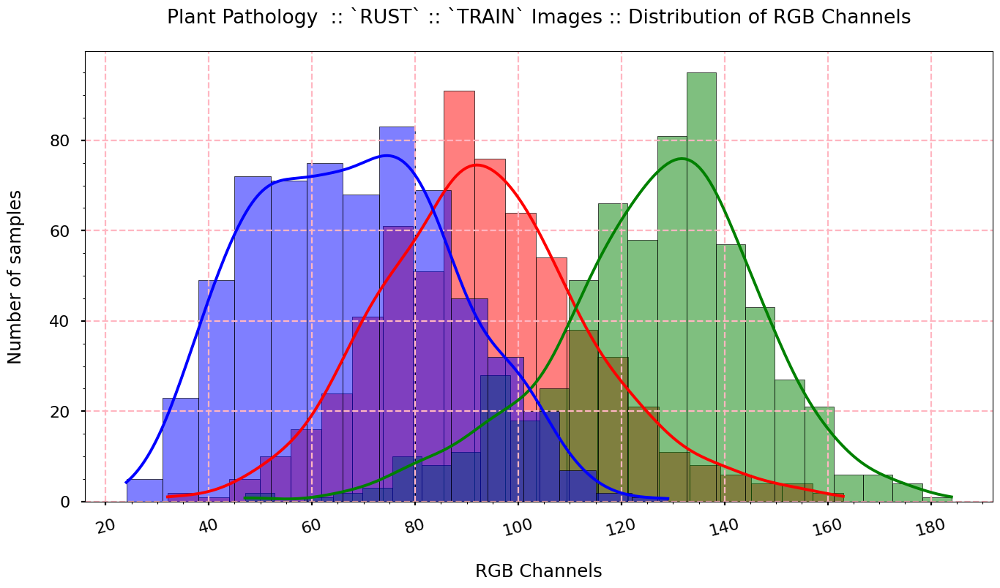

In [ ]:
# Visualizing distribution of RGB channels of RUST :: TRAIN Images
with plt.style.context('seaborn-poster'):
    plt.figure(figsize=(16,8))
    sns.histplot(train_img_chnl_data_tgts[train_img_chnl_data_tgts['rust'] == 1]['Red'], kde=True, color='red', legend=True)
    sns.histplot(train_img_chnl_data_tgts[train_img_chnl_data_tgts['rust'] == 1]['Green'], kde=True, color='green', legend=True)
    sns.histplot(train_img_chnl_data_tgts[train_img_chnl_data_tgts['rust'] == 1]['Blue'], kde=True, color='blue', legend=True)
    # Providing the labels and title to the graph
    plt.xlabel("\nRGB Channels")
    plt.xticks(rotation=15)
    plt.ylabel("Number of samples\n")
    plt.minorticks_on()
    plt.grid(which='major', linestyle="--", color='lightpink')
    plt.title("Plant Pathology  :: `RUST` :: `TRAIN` Images :: Distribution of RGB Channels\n")

###  ALL Images  ::  RED channel  ###  
  MIN --> 32.0  
  MAX --> 163.0  
  MEAN --> 93.44855305466238  
  MEDIAN --> 92.0
  RANGE --> 131.0

###  ALL Images  ::  GREEN channel  ###  
  MIN --> 47.0  
  MAX --> 184.0  
  MEAN --> 126.54019292604502  
  MEDIAN --> 128.0
  RANGE --> 137.0

###  ALL Images  ::  BLUE channel  ###  
  MIN --> 24.0  
  MAX --> 129.0  
  MEAN --> 67.65434083601286  
  MEDIAN --> 67.0
  RANGE --> 105.0



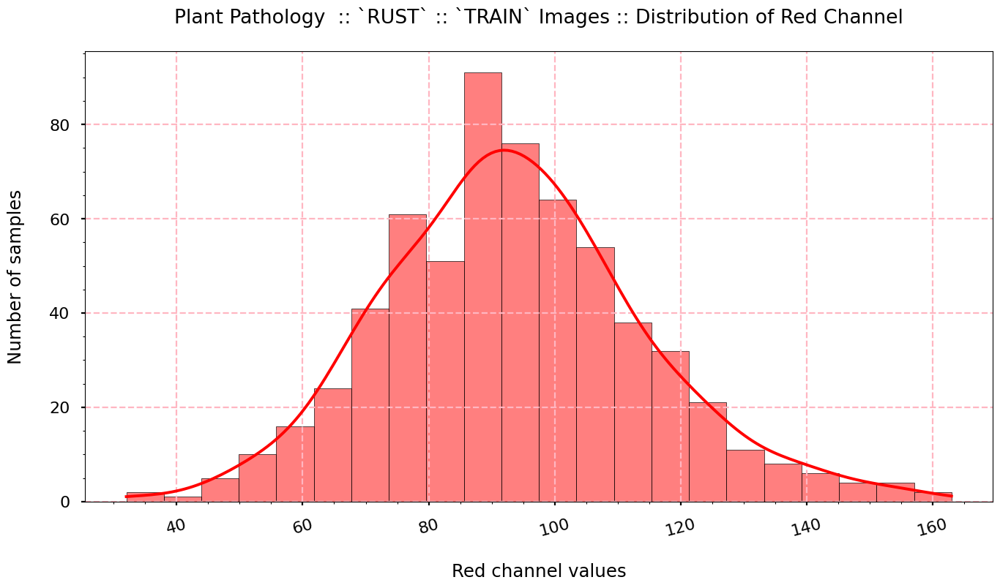

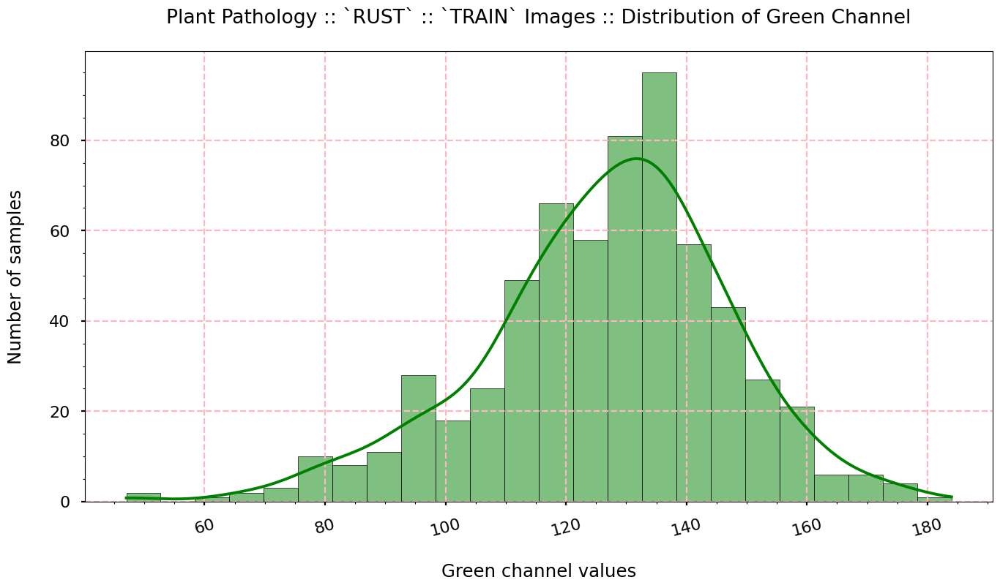

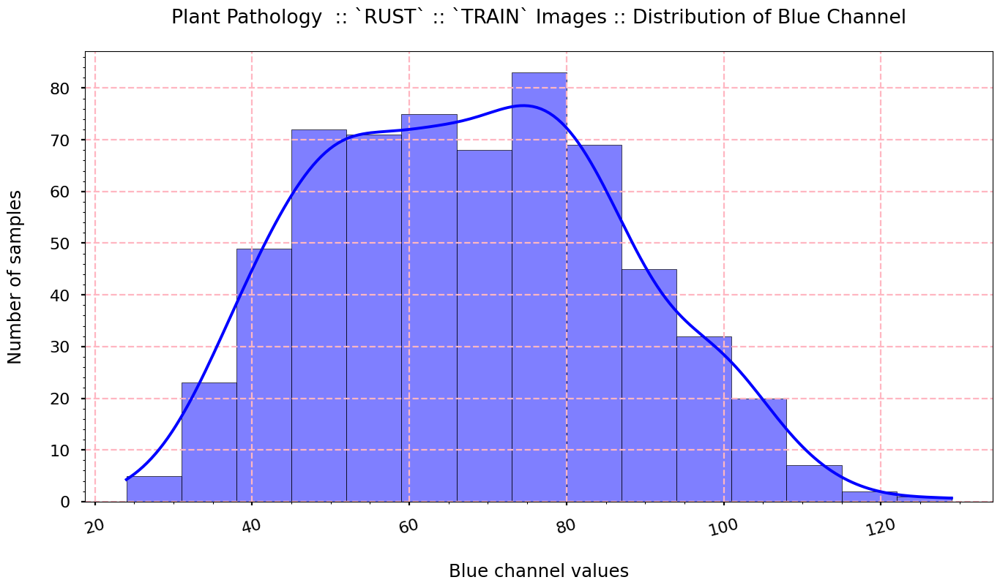

In [ ]:
# MIN, MAX, MEAN & MEDIAN of a channel
print("###  {}  ::  {} channel  ###  \n  MIN --> {}  \n  MAX --> {}  \n  MEAN --> {}  \
\n  MEDIAN --> {}\n  RANGE --> {}\n".format("ALL Images",
                                            "RED",
                                            train_img_chnl_data_tgts[train_img_chnl_data_tgts['rust'] == 1]['Red'].min(),
                                            train_img_chnl_data_tgts[train_img_chnl_data_tgts['rust'] == 1]['Red'].max(),
                                            train_img_chnl_data_tgts[train_img_chnl_data_tgts['rust'] == 1]['Red'].mean(),
                                            train_img_chnl_data_tgts[train_img_chnl_data_tgts['rust'] == 1]['Red'].median(),
                                            (train_img_chnl_data_tgts[train_img_chnl_data_tgts['rust'] == 1]['Red'].max() - train_img_chnl_data_tgts[train_img_chnl_data_tgts['rust'] == 1]['Red'].min())))

# Visualizing only RED channel
with plt.style.context('seaborn-poster'):
    plt.figure(figsize=(16,8))
    sns.histplot(train_img_chnl_data_tgts[train_img_chnl_data_tgts['rust'] == 1]['Red'], kde=True, color='red', legend=True)
    # Providing the labels and title to the graph
    plt.xlabel("\nRed channel values")
    plt.xticks(rotation=15)
    plt.ylabel("Number of samples\n")
    plt.minorticks_on()
    plt.grid(which='major', linestyle="--", color='lightpink')
    plt.title("Plant Pathology  :: `RUST` :: `TRAIN` Images :: Distribution of Red Channel\n")
# MIN, MAX, MEAN & MEDIAN of a channel
print("###  {}  ::  {} channel  ###  \n  MIN --> {}  \n  MAX --> {}  \n  MEAN --> {}  \
\n  MEDIAN --> {}\n  RANGE --> {}\n".format("ALL Images",
                                            "GREEN",
                                            train_img_chnl_data_tgts[train_img_chnl_data_tgts['rust'] == 1]['Green'].min(),
                                            train_img_chnl_data_tgts[train_img_chnl_data_tgts['rust'] == 1]['Green'].max(),
                                            train_img_chnl_data_tgts[train_img_chnl_data_tgts['rust'] == 1]['Green'].mean(),
                                            train_img_chnl_data_tgts[train_img_chnl_data_tgts['rust'] == 1]['Green'].median(),
                                            (train_img_chnl_data_tgts[train_img_chnl_data_tgts['rust'] == 1]['Green'].max() - train_img_chnl_data_tgts[train_img_chnl_data_tgts['rust'] == 1]['Green'].min())))

# Visualizing only GREEN channel
with plt.style.context('seaborn-poster'):
    plt.figure(figsize=(16,8))
    sns.histplot(train_img_chnl_data_tgts[train_img_chnl_data_tgts['rust'] == 1]['Green'], kde=True, color='green', legend=True)
    # Providing the labels and title to the graph
    plt.xlabel("\nGreen channel values")
    plt.xticks(rotation=15)
    plt.ylabel("Number of samples\n")
    plt.minorticks_on()
    plt.grid(which='major', linestyle="--", color='lightpink')
    plt.title("Plant Pathology :: `RUST` :: `TRAIN` Images :: Distribution of Green Channel\n")
# MIN, MAX, MEAN & MEDIAN of a channel
print("###  {}  ::  {} channel  ###  \n  MIN --> {}  \n  MAX --> {}  \n  MEAN --> {}  \
\n  MEDIAN --> {}\n  RANGE --> {}\n".format("ALL Images",
                                            "BLUE",
                                            train_img_chnl_data_tgts[train_img_chnl_data_tgts['rust'] == 1]['Blue'].min(),
                                            train_img_chnl_data_tgts[train_img_chnl_data_tgts['rust'] == 1]['Blue'].max(),
                                            train_img_chnl_data_tgts[train_img_chnl_data_tgts['rust'] == 1]['Blue'].mean(),
                                            train_img_chnl_data_tgts[train_img_chnl_data_tgts['rust'] == 1]['Blue'].median(),
                                            (train_img_chnl_data_tgts[train_img_chnl_data_tgts['rust'] == 1]['Blue'].max() - train_img_chnl_data_tgts[train_img_chnl_data_tgts['rust'] == 1]['Blue'].min())))

# Visualizing only BLUE channel
with plt.style.context('seaborn-poster'):
    plt.figure(figsize=(16,8))
    sns.histplot(train_img_chnl_data_tgts[train_img_chnl_data_tgts['rust'] == 1]['Blue'], kde=True, color='blue', legend=True)
    # Providing the labels and title to the graph
    plt.xlabel("\nBlue channel values")
    plt.xticks(rotation=15)
    plt.ylabel("Number of samples\n")
    plt.minorticks_on()
    plt.grid(which='major', linestyle="--", color='lightpink')
    plt.title("Plant Pathology  :: `RUST` :: `TRAIN` Images :: Distribution of Blue Channel\n")

In [ ]:
# Displaying the statistics related to every channel
## MIN, MAX, MEAN & MEDIAN of RGB channels of only MD :: TRAIN images
cols = ['MIN', 'MAX', 'MEAN', 'MEDIAN', "RANGE", "STDDEV"]

tr_img_red_sts3 = pd.DataFrame([train_img_chnl_data_tgts[train_img_chnl_data_tgts['rust'] == 1]['Red'].min(),
                                train_img_chnl_data_tgts[train_img_chnl_data_tgts['rust'] == 1]['Red'].max(),
                                np.round(train_img_chnl_data_tgts[train_img_chnl_data_tgts['rust'] == 1]['Red'].mean(),1),
                                train_img_chnl_data_tgts[train_img_chnl_data_tgts['rust'] == 1]['Red'].median(),
                                (train_img_chnl_data_tgts[train_img_chnl_data_tgts['rust'] == 1]['Red'].max() - train_img_chnl_data_tgts[train_img_chnl_data_tgts['rust'] == 1]['Red'].min()),
                                np.std(train_img_chnl_data_tgts[train_img_chnl_data_tgts['rust'] == 1]['Red'])]).T
tr_img_red_sts3.columns = cols

tr_img_green_sts3 = pd.DataFrame([train_img_chnl_data_tgts[train_img_chnl_data_tgts['rust'] == 1]['Green'].min(),
                                 train_img_chnl_data_tgts[train_img_chnl_data_tgts['rust'] == 1]['Green'].max(),
                                  np.round(train_img_chnl_data_tgts[train_img_chnl_data_tgts['rust'] == 1]['Green'].mean(),1),
                                 train_img_chnl_data_tgts[train_img_chnl_data_tgts['rust'] == 1]['Green'].median(),
                                 (train_img_chnl_data_tgts[train_img_chnl_data_tgts['rust'] == 1]['Green'].max() - train_img_chnl_data_tgts[train_img_chnl_data_tgts['rust'] == 1]['Green'].min()),
                                 np.std(train_img_chnl_data_tgts[train_img_chnl_data_tgts['rust'] == 1]['Green'])]).T
tr_img_green_sts3.columns = cols
tr_img_blue_sts3 = pd.DataFrame([train_img_chnl_data_tgts[train_img_chnl_data_tgts['rust'] == 1]['Blue'].min(),
                                train_img_chnl_data_tgts[train_img_chnl_data_tgts['rust'] == 1]['Blue'].max(),
                                 np.round(train_img_chnl_data_tgts[train_img_chnl_data_tgts['rust'] == 1]['Blue'].mean(),1),
                                train_img_chnl_data_tgts[train_img_chnl_data_tgts['rust'] == 1]['Blue'].median(),
                                (train_img_chnl_data_tgts[train_img_chnl_data_tgts['rust'] == 1]['Blue'].max() - train_img_chnl_data_tgts[train_img_chnl_data_tgts['rust'] == 1]['Blue'].min()),
                                np.std(train_img_chnl_data_tgts[train_img_chnl_data_tgts['rust'] == 1]['Blue'])]).T
tr_img_blue_sts3.columns = cols

tr_img_rgb_sts3 = pd.concat([tr_img_red_sts3, tr_img_green_sts3, tr_img_blue_sts3], axis=0)
tr_img_rgb_sts3.index = ["RED", "GREEN", "BLUE"]
tr_img_rgb_sts3

,MIN,MAX,MEAN,MEDIAN,RANGE,STDDEV
RED,32.0,163.0,93.4,92.0,131.0,20.812973
GREEN,47.0,184.0,126.5,128.0,137.0,20.436180
BLUE,24.0,129.0,67.7,67.0,105.0,19.283328


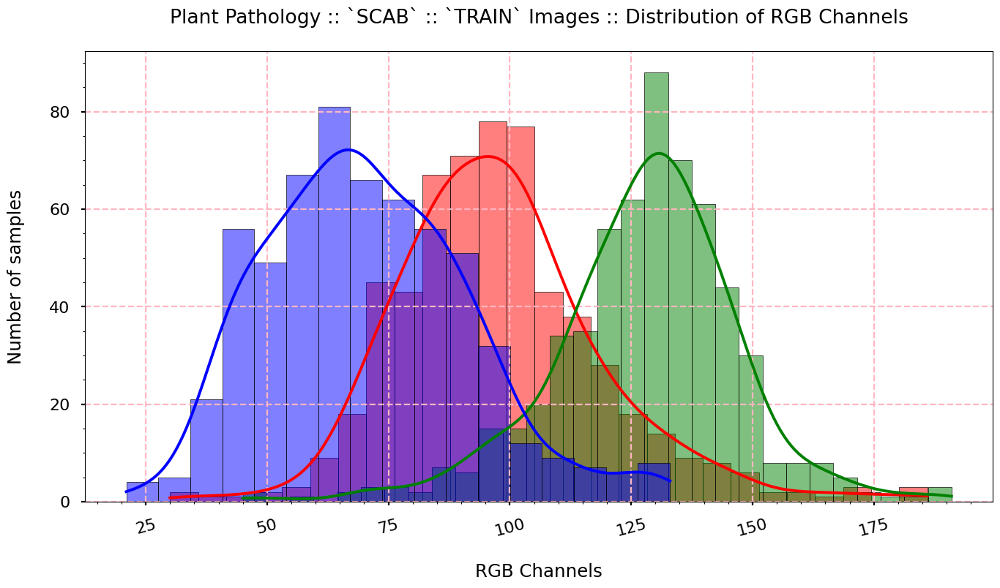

In [ ]:
with plt.style.context('seaborn-poster'):
    plt.figure(figsize=(16,8))
    sns.histplot(train_img_chnl_data_tgts[train_img_chnl_data_tgts['scab'] == 1]['Red'], kde=True, color='red', legend=True)
    sns.histplot(train_img_chnl_data_tgts[train_img_chnl_data_tgts['scab'] == 1]['Green'], kde=True, color='green', legend=True)
    sns.histplot(train_img_chnl_data_tgts[train_img_chnl_data_tgts['scab'] == 1]['Blue'], kde=True, color='blue', legend=True)
    # Providing the labels and title to the graph
    plt.xlabel("\nRGB Channels")
    plt.xticks(rotation=15)
    plt.ylabel("Number of samples\n")
    plt.minorticks_on()
    plt.grid(which='major', linestyle="--", color='lightpink')
    plt.title("Plant Pathology :: `SCAB` :: `TRAIN` Images :: Distribution of RGB Channels\n")

###  ALL Images  ::  RED channel  ###  
  MIN --> 30.0  
  MAX --> 186.0  
  MEAN --> 97.88851351351352  
  MEDIAN --> 96.0
  RANGE --> 156.0

###  ALL Images  ::  GREEN channel  ###  
  MIN --> 45.0  
  MAX --> 191.0  
  MEAN --> 127.80236486486487  
  MEDIAN --> 129.0
  RANGE --> 146.0

###  ALL Images  ::  BLUE channel  ###  
  MIN --> 21.0  
  MAX --> 133.0  
  MEAN --> 70.39358108108108  
  MEDIAN --> 69.0
  RANGE --> 112.0



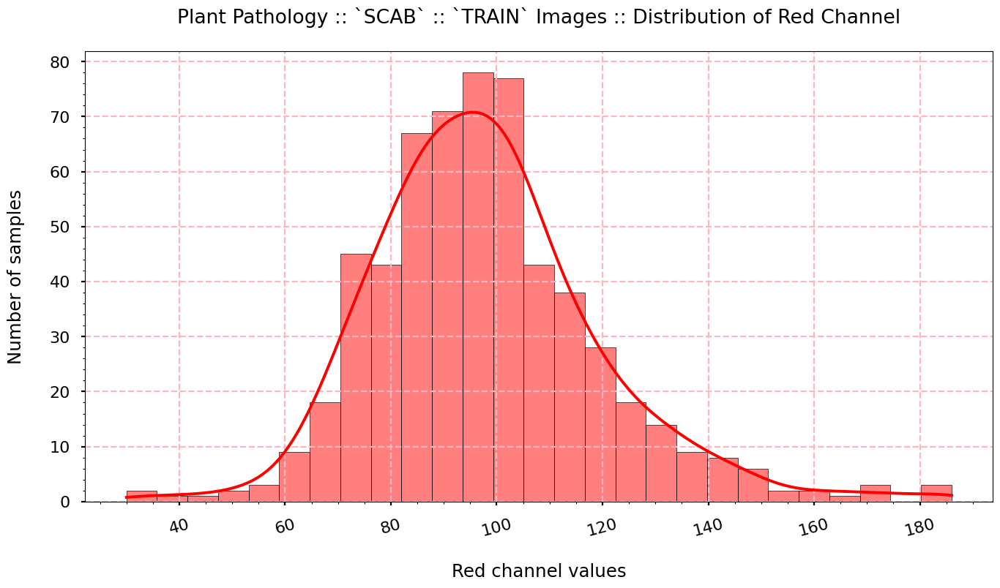

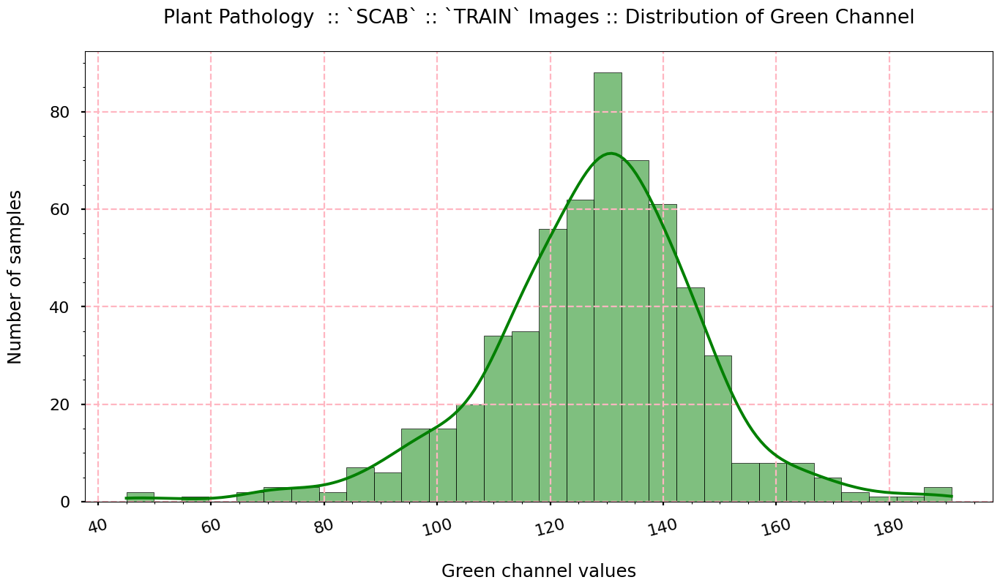

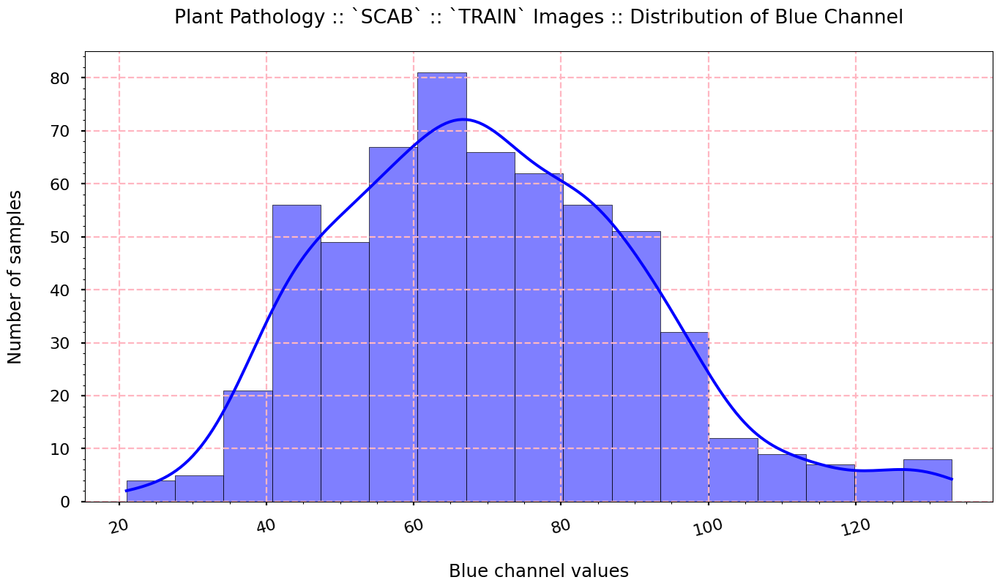

In [ ]:
# MIN, MAX, MEAN & MEDIAN of a channel
print("###  {}  ::  {} channel  ###  \n  MIN --> {}  \n  MAX --> {}  \n  MEAN --> {}  \
\n  MEDIAN --> {}\n  RANGE --> {}\n".format("ALL Images",
                                            "RED",
                                            train_img_chnl_data_tgts[train_img_chnl_data_tgts['scab'] == 1]['Red'].min(),
                                            train_img_chnl_data_tgts[train_img_chnl_data_tgts['scab'] == 1]['Red'].max(),
                                            train_img_chnl_data_tgts[train_img_chnl_data_tgts['scab'] == 1]['Red'].mean(),
                                            train_img_chnl_data_tgts[train_img_chnl_data_tgts['scab'] == 1]['Red'].median(),
                                            (train_img_chnl_data_tgts[train_img_chnl_data_tgts['scab'] == 1]['Red'].max() - train_img_chnl_data_tgts[train_img_chnl_data_tgts['scab'] == 1]['Red'].min())))

# Visualizing only RED channel
with plt.style.context('seaborn-poster'):
    plt.figure(figsize=(16,8))
    sns.histplot(train_img_chnl_data_tgts[train_img_chnl_data_tgts['scab'] == 1]['Red'], kde=True, color='red', legend=True)
    # Providing the labels and title to the graph
    plt.xlabel("\nRed channel values")
    plt.xticks(rotation=15)
    plt.ylabel("Number of samples\n")
    plt.minorticks_on()
    plt.grid(which='major', linestyle="--", color='lightpink')
    plt.title("Plant Pathology :: `SCAB` :: `TRAIN` Images :: Distribution of Red Channel\n")
# MIN, MAX, MEAN & MEDIAN of a channel
print("###  {}  ::  {} channel  ###  \n  MIN --> {}  \n  MAX --> {}  \n  MEAN --> {}  \
\n  MEDIAN --> {}\n  RANGE --> {}\n".format("ALL Images",
                                            "GREEN",
                                            train_img_chnl_data_tgts[train_img_chnl_data_tgts['scab'] == 1]['Green'].min(),
                                            train_img_chnl_data_tgts[train_img_chnl_data_tgts['scab'] == 1]['Green'].max(),
                                            train_img_chnl_data_tgts[train_img_chnl_data_tgts['scab'] == 1]['Green'].mean(),
                                            train_img_chnl_data_tgts[train_img_chnl_data_tgts['scab'] == 1]['Green'].median(),
                                            (train_img_chnl_data_tgts[train_img_chnl_data_tgts['scab'] == 1]['Green'].max() - train_img_chnl_data_tgts[train_img_chnl_data_tgts['scab'] == 1]['Green'].min())))

# Visualizing only GREEN channel
with plt.style.context('seaborn-poster'):
    plt.figure(figsize=(16,8))
    sns.histplot(train_img_chnl_data_tgts[train_img_chnl_data_tgts['scab'] == 1]['Green'], kde=True, color='green', legend=True)
    # Providing the labels and title to the graph
    plt.xlabel("\nGreen channel values")
    plt.xticks(rotation=15)
    plt.ylabel("Number of samples\n")
    plt.minorticks_on()
    plt.grid(which='major', linestyle="--", color='lightpink')
    plt.title("Plant Pathology  :: `SCAB` :: `TRAIN` Images :: Distribution of Green Channel\n")
# MIN, MAX, MEAN & MEDIAN of a channel
print("###  {}  ::  {} channel  ###  \n  MIN --> {}  \n  MAX --> {}  \n  MEAN --> {}  \
\n  MEDIAN --> {}\n  RANGE --> {}\n".format("ALL Images",
                                            "BLUE",
                                            train_img_chnl_data_tgts[train_img_chnl_data_tgts['scab'] == 1]['Blue'].min(),
                                            train_img_chnl_data_tgts[train_img_chnl_data_tgts['scab'] == 1]['Blue'].max(),
                                            train_img_chnl_data_tgts[train_img_chnl_data_tgts['scab'] == 1]['Blue'].mean(),
                                            train_img_chnl_data_tgts[train_img_chnl_data_tgts['scab'] == 1]['Blue'].median(),
                                            (train_img_chnl_data_tgts[train_img_chnl_data_tgts['scab'] == 1]['Blue'].max() - train_img_chnl_data_tgts[train_img_chnl_data_tgts['scab'] == 1]['Blue'].min())))

# Visualizing only BLUE channel
with plt.style.context('seaborn-poster'):
    plt.figure(figsize=(16,8))
    sns.histplot(train_img_chnl_data_tgts[train_img_chnl_data_tgts['scab'] == 1]['Blue'], kde=True, color='blue', legend=True)
    # Providing the labels and title to the graph
    plt.xlabel("\nBlue channel values")
    plt.xticks(rotation=15)
    plt.ylabel("Number of samples\n")
    plt.minorticks_on()
    plt.grid(which='major', linestyle="--", color='lightpink')
    plt.title("Plant Pathology :: `SCAB` :: `TRAIN` Images :: Distribution of Blue Channel\n")

In [ ]:
# Displaying the statistics related to every channel
## MIN, MAX, MEAN & MEDIAN of RGB channels of only MD :: TRAIN images
cols = ['MIN', 'MAX', 'MEAN', 'MEDIAN', "RANGE", "STDDEV"]

tr_img_red_sts4 = pd.DataFrame([train_img_chnl_data_tgts[train_img_chnl_data_tgts['scab'] == 1]['Red'].min(),
                                train_img_chnl_data_tgts[train_img_chnl_data_tgts['scab'] == 1]['Red'].max(),
                                np.round(train_img_chnl_data_tgts[train_img_chnl_data_tgts['scab'] == 1]['Red'].mean(),1),
                                train_img_chnl_data_tgts[train_img_chnl_data_tgts['scab'] == 1]['Red'].median(),
                                (train_img_chnl_data_tgts[train_img_chnl_data_tgts['scab'] == 1]['Red'].max() - train_img_chnl_data_tgts[train_img_chnl_data_tgts['scab'] == 1]['Red'].min()),
                                np.std(train_img_chnl_data_tgts[train_img_chnl_data_tgts['scab'] == 1]['Red'])]).T
tr_img_red_sts4.columns = cols

tr_img_green_sts4 = pd.DataFrame([train_img_chnl_data_tgts[train_img_chnl_data_tgts['scab'] == 1]['Green'].min(),
                                 train_img_chnl_data_tgts[train_img_chnl_data_tgts['scab'] == 1]['Green'].max(),
                                  np.round(train_img_chnl_data_tgts[train_img_chnl_data_tgts['scab'] == 1]['Green'].mean(),1),
                                 train_img_chnl_data_tgts[train_img_chnl_data_tgts['scab'] == 1]['Green'].median(),
                                 (train_img_chnl_data_tgts[train_img_chnl_data_tgts['scab'] == 1]['Green'].max() - train_img_chnl_data_tgts[train_img_chnl_data_tgts['scab'] == 1]['Green'].min()),
                                 np.std(train_img_chnl_data_tgts[train_img_chnl_data_tgts['scab'] == 1]['Green'])]).T
tr_img_green_sts4.columns = cols
tr_img_blue_sts4 = pd.DataFrame([train_img_chnl_data_tgts[train_img_chnl_data_tgts['scab'] == 1]['Blue'].min(),
                                train_img_chnl_data_tgts[train_img_chnl_data_tgts['scab'] == 1]['Blue'].max(),
                                 np.round(train_img_chnl_data_tgts[train_img_chnl_data_tgts['scab'] == 1]['Blue'].mean(),1),
                                train_img_chnl_data_tgts[train_img_chnl_data_tgts['scab'] == 1]['Blue'].median(),
                                (train_img_chnl_data_tgts[train_img_chnl_data_tgts['scab'] == 1]['Blue'].max() - train_img_chnl_data_tgts[train_img_chnl_data_tgts['scab'] == 1]['Blue'].min()),
                                np.std(train_img_chnl_data_tgts[train_img_chnl_data_tgts['scab'] == 1]['Blue'])]).T
tr_img_blue_sts4.columns = cols

tr_img_rgb_sts4 = pd.concat([tr_img_red_sts4, tr_img_green_sts4, tr_img_blue_sts4], axis=0)
tr_img_rgb_sts4.index = ["RED", "GREEN", "BLUE"]
tr_img_rgb_sts4

,MIN,MAX,MEAN,MEDIAN,RANGE,STDDEV
RED,30.0,186.0,97.9,96.0,156.0,21.392276
GREEN,45.0,191.0,127.8,129.0,146.0,19.056720
BLUE,21.0,133.0,70.4,69.0,112.0,20.655610


In [ ]:
rgb_stats = pd.concat([all_img_rgb_sts, tr_img_rgb_sts, tr_img_rgb_sts2, tr_img_rgb_sts3, tr_img_rgb_sts4], axis=0)
rgb_stats['Category'] = ['ALL_Images', 'ALL_Images', 'ALL_Images', 'TR_HL', 'TR_HL', 'TR_HL', 'TR_MD', 'TR_MD', 'TR_MD',
                         'TR_RU', 'TR_RU', 'TR_RU', 'TR_SC', 'TR_SC', 'TR_SC']
rgb_stats.reset_index(drop=False, inplace=True)
rgb_stats.rename(columns={'index':'Channel'}, inplace=True)
rgb_stats

,Channel,MIN,MAX,MEAN,MEDIAN,RANGE,STDDEV,Category
0,RED,29.0,186.0,94.5,94.0,157.0,20.537577,ALL_Images
1,GREEN,42.0,198.0,126.9,128.0,156.0,19.909084,ALL_Images
2,BLUE,15.0,143.0,73.2,72.0,128.0,21.456250,ALL_Images
3,RED,29.0,160.0,89.0,87.0,131.0,20.992744,TR_HL
4,GREEN,51.0,183.0,123.3,124.0,132.0,19.693353,TR_HL
5,BLUE,26.0,138.0,73.9,71.0,112.0,22.037715,TR_HL
6,RED,47.0,127.0,92.9,93.0,80.0,15.719418,TR_MD
7,GREEN,85.0,165.0,127.4,130.0,80.0,16.196058,TR_MD
8,BLUE,27.0,105.0,65.1,62.0,78.0,14.841326,TR_MD
9,RED,32.0,163.0,93.4,92.0,131.0,20.812973,TR_RU


/usr/local/lib/python3.10/dist-packages/seaborn/categorical.py:1680: UserWarning:

You passed a edgecolor/edgecolors ([(0.0, 0.0, 0.0), (0.0, 0.0, 0.0), (0.0, 0.0, 0.0), (0.0, 0.0, 0.0), (0.0, 0.0, 0.0)]) for an unfilled marker ('').  Matplotlib is ignoring the edgecolor in favor of the facecolor.  This behavior may change in the future.

/usr/local/lib/python3.10/dist-packages/seaborn/categorical.py:1680: UserWarning:

You passed a edgecolor/edgecolors ([(0.0, 0.0, 0.0), (0.0, 0.0, 0.0), (0.0, 0.0, 0.0), (0.0, 0.0, 0.0), (0.0, 0.0, 0.0)]) for an unfilled marker ('').  Matplotlib is ignoring the edgecolor in favor of the facecolor.  This behavior may change in the future.

/usr/local/lib/python3.10/dist-packages/seaborn/categorical.py:1680: UserWarning:

You passed a edgecolor/edgecolors ([(0.0, 0.0, 0.0), (0.0, 0.0, 0.0), (0.0, 0.0, 0.0), (0.0, 0.0, 0.0), (0.0, 0.0, 0.0)]) for an unfilled marker ('').  Matplotlib is ignoring the edgecolor in favor of the facecolor.  This behavior may 

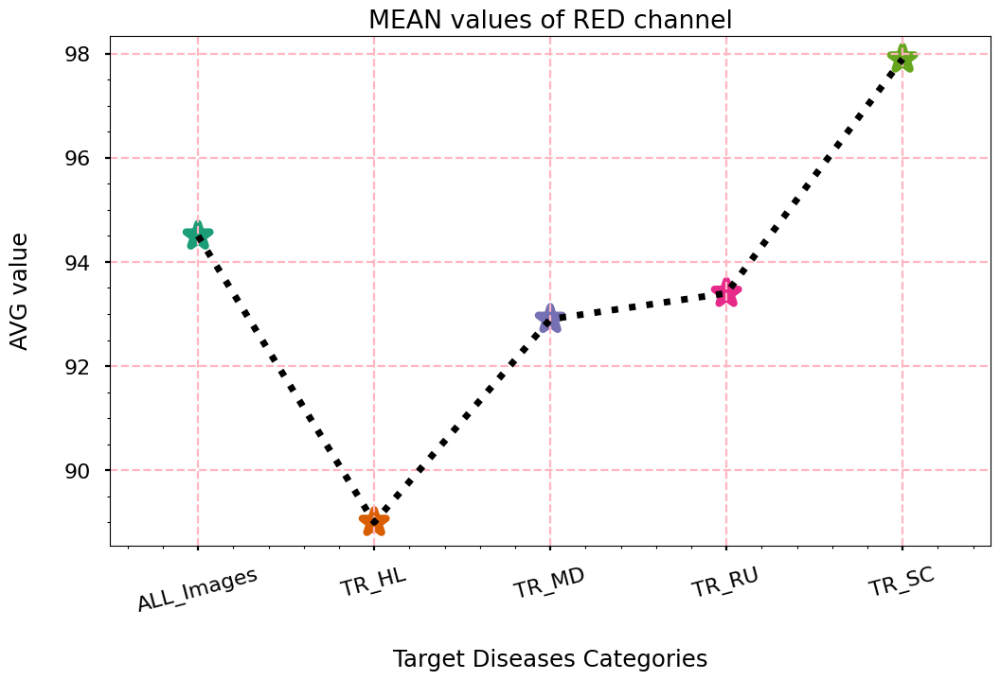

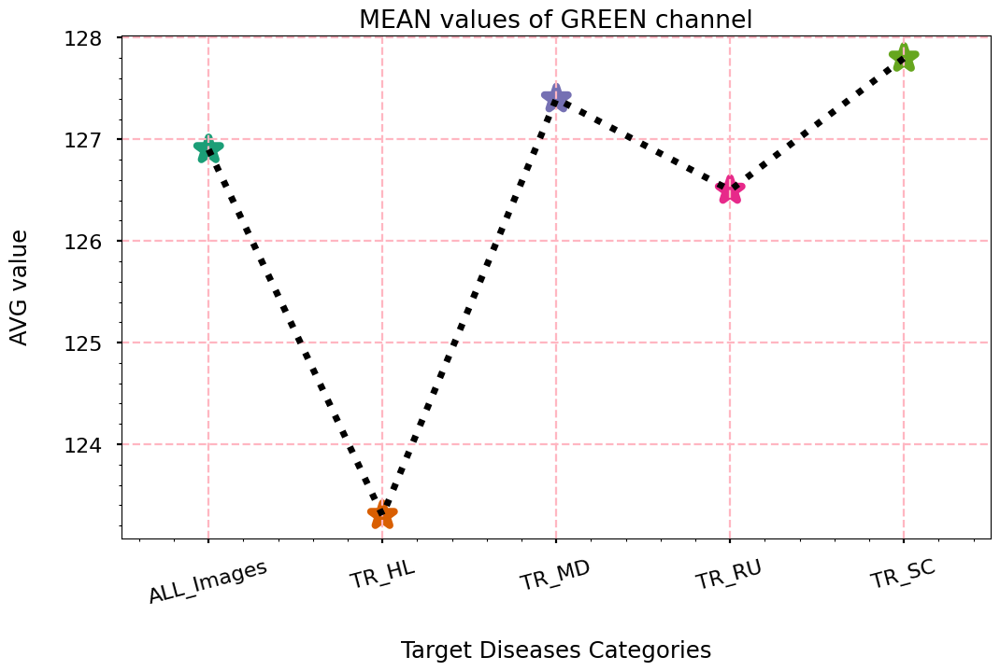

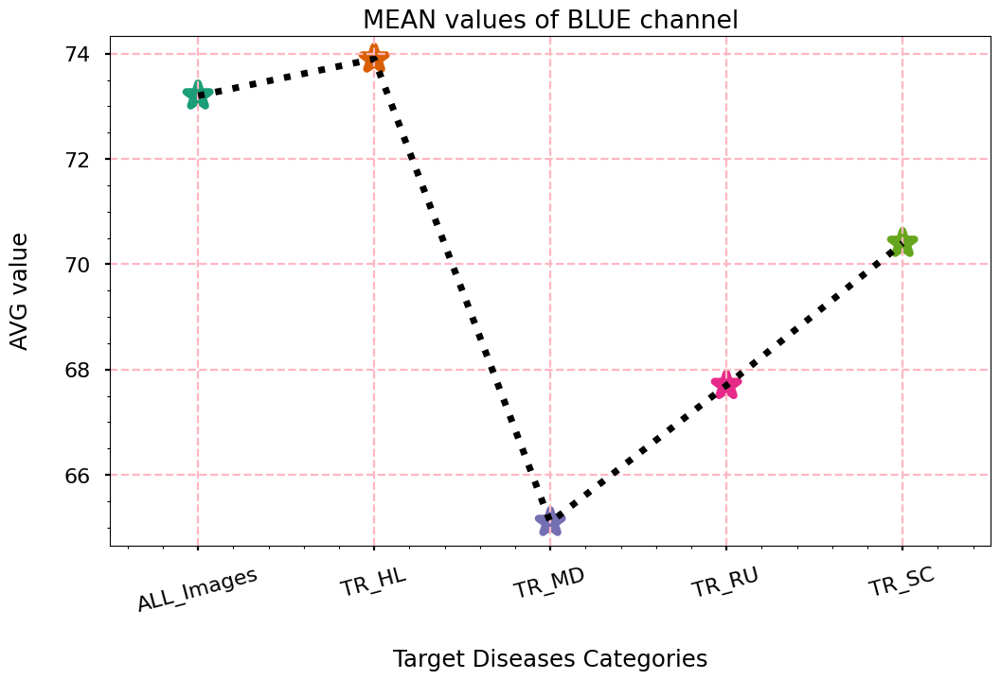

In [ ]:
# Visualizing MEAN values of a channel across all categories
with plt.style.context('seaborn-poster'):
    plt.figure(figsize=(12,7))
    sns.pointplot(data=rgb_stats[rgb_stats['Channel'] == 'RED'][['MEAN','Category']], x='Category', y='MEAN', color='black', markers="",
                 linestyles=":")
    sns.pointplot(data=rgb_stats[rgb_stats['Channel'] == 'RED'][['MEAN','Category']], x='Category', y='MEAN', palette='Dark2',
                  scale=1.5, markers="*")
    # Providing the labels and title to the graph
    plt.xlabel("\nTarget Diseases Categories")
    plt.xticks(rotation=15)
    plt.ylabel("AVG value\n")
    plt.minorticks_on()
    plt.grid(which='major', linestyle="--", color='lightpink')
    plt.title("MEAN values of RED channel")
# Visualizing MEAN values of a channel across all categories
with plt.style.context('seaborn-poster'):
    plt.figure(figsize=(12,7))
    sns.pointplot(data=rgb_stats[rgb_stats['Channel'] == 'GREEN'][['MEAN','Category']], x='Category', y='MEAN', color='black', markers="",
                 linestyles=":")
    sns.pointplot(data=rgb_stats[rgb_stats['Channel'] == 'GREEN'][['MEAN','Category']], x='Category', y='MEAN', palette='Dark2',
                  scale=1.5, markers="*")
    # Providing the labels and title to the graph
    plt.xlabel("\nTarget Diseases Categories")
    plt.xticks(rotation=15)
    plt.ylabel("AVG value\n")
    plt.minorticks_on()
    plt.grid(which='major', linestyle="--", color='lightpink')
    plt.title("MEAN values of GREEN channel")
# Visualizing MEAN values of a channel across all categories
with plt.style.context('seaborn-poster'):
    plt.figure(figsize=(12,7))
    sns.pointplot(data=rgb_stats[rgb_stats['Channel'] == 'BLUE'][['MEAN','Category']], x='Category', y='MEAN', color='k', markers="",
                 linestyles=":")
    sns.pointplot(data=rgb_stats[rgb_stats['Channel'] == 'BLUE'][['MEAN','Category']], x='Category', y='MEAN', palette='Dark2', scale=1.5,
                  markers="*")
    # Providing the labels and title to the graph
    plt.xlabel("\nTarget Diseases Categories")
    plt.xticks(rotation=15)
    plt.ylabel("AVG value\n")
    plt.minorticks_on()
    plt.grid(which='major', linestyle="--", color='lightpink')
    plt.title("MEAN values of BLUE channel")

In [1]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


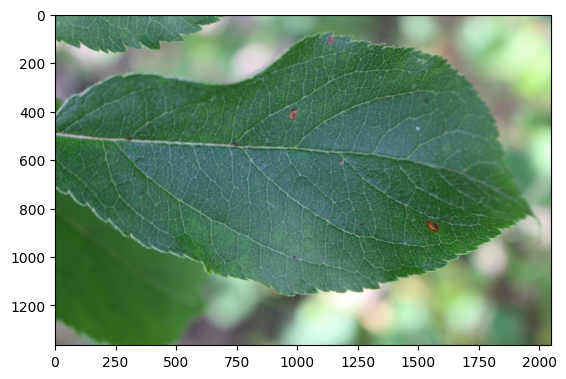

In [7]:
image1=Image.open(r'/content/drive/MyDrive/apple/images/Original Dataset/Test_10.jpg')
plt.imshow(image1)
plt.show()

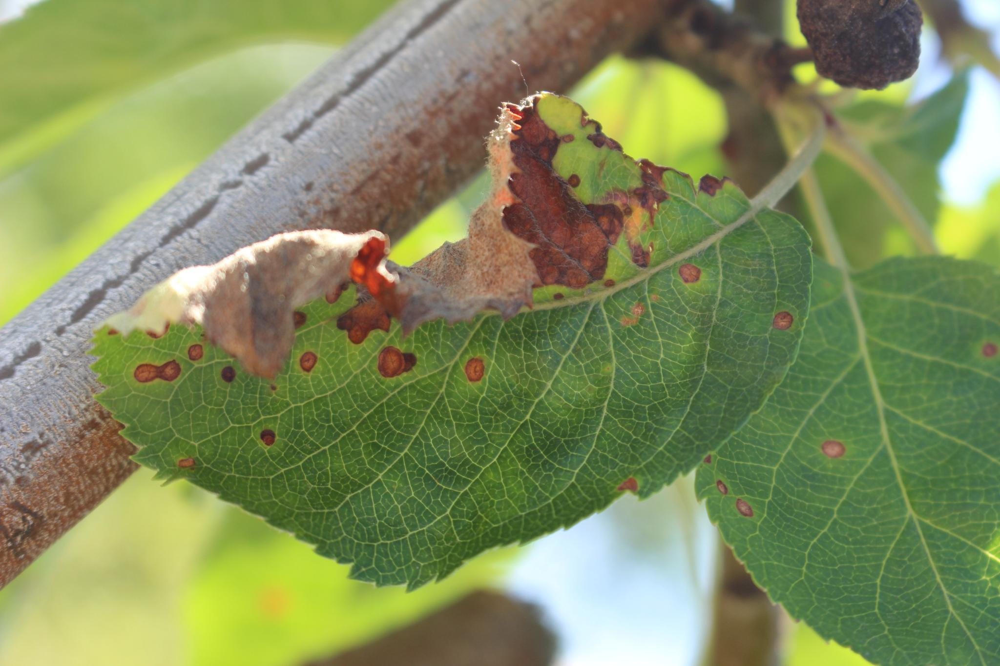

In [8]:
from IPython.display import Image
Image("/content/drive/MyDrive/apple/images/train/multiple_diseases/Train_1.jpg")

In [9]:
class_names=train.loc[:,'healthy':].columns
print(class_names)

Index(['healthy', 'multiple_diseases', 'rust', 'scab'], dtype='object')


In [10]:
number=0
train['label']=0
for i in class_names:
    train['label']=train['label'] + train[i] * number
    number=number+1

In [11]:
DIR

'/content/drive/MyDrive/apple'

In [12]:
natsort.natsorted(os.listdir(DIR))

['images', 'labels', 'madhavib', 'models']

In [13]:
def get_label_img(img):
    if search("Train",img):
        img=img.split('.')[0]
        label=train.loc[train['image_id']==img]['label']
        return label

In [14]:
def create_train_data():
    images=natsort.natsorted(os.listdir(DIR))
    for img in tqdm(images):
        label=get_label_img(img)
        path=os.path.join(DIR,img)

        if search("Train",img):
            if (img.split("_")[1].split(".")[0]) and label.item()==0:
                shutil.copy(path,r'/content/drive/MyDrive/apple/images/train/healthy')

            elif(img.split("_")[1].split(".")[0]) and label.item()==1:
                shutil.copy(path,r'/content/drive/MyDrive/apple/images/train/multiple_disease')

            elif(img.split("_")[1].split(".")[0]) and label.item()==2:
                shutil.copy(path,r'/content/drive/MyDrive/apple/images/train/rust')

            elif(img.split("_")[1].split(".")[0]) and label.item()==3:
                shutil.copy(path,r'/content/drive/MyDrive/apple/images/train/scab')

        elif search("Test",img):
            shutil.copy(path,r'/content/drive/MyDrive/apple/images/test')

In [ ]:
shutil.os.mkdir(r'/content/drive/MyDrive/apple/madhavib')

In [ ]:
shutil.os.mkdir(r'/content/drive/MyDrive/apple/madhavib/train')

In [ ]:
shutil.os.mkdir(r'/content/drive/MyDrive/apple/madhavib/train/healthy')

In [ ]:
shutil.os.mkdir(r'/content/drive/MyDrive/apple/madhavib/train/multiple_disease')

In [ ]:
shutil.os.mkdir(r'/content/drive/MyDrive/apple/madhavib/train/rust')

In [ ]:
shutil.os.mkdir(r'/content/drive/MyDrive/apple/madhavib/train/scab')

In [ ]:
shutil.os.mkdir(r'/content/drive/MyDrive/apple/madhavib/test')

In [ ]:
train_dir=create_train_data()

100%|██████████| 4/4 [00:00<00:00, 6507.84it/s]


In [15]:
print(create_train_data())

100%|██████████| 4/4 [00:00<00:00, 4100.00it/s]

None


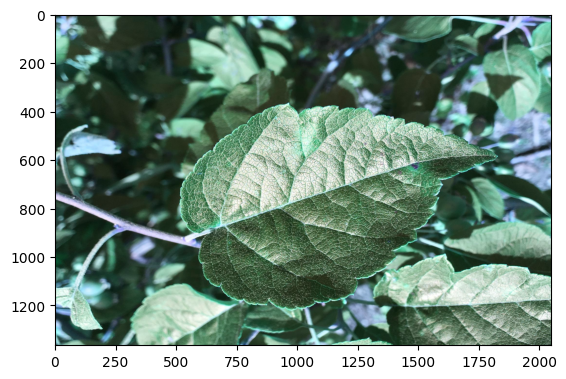

In [16]:
Train_DIR=r'/content/drive/MyDrive/apple/images/train'
Categories=['healthy','multiple_disease','rust','scab']

for j in Categories:
    path=os.path.join(Train_DIR,j)
    for img in os.listdir(path):
        old_image=cv2.imread(os.path.join(path,img),cv2.COLOR_BGR2RGB)
        plt.imshow(old_image)
        plt.show()
        break
    break

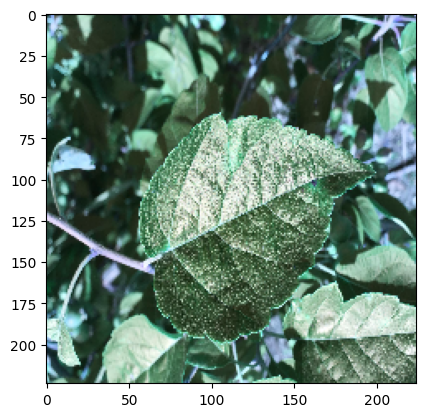

In [17]:
IMG_SIZE=224
new_image=cv2.resize(old_image,(IMG_SIZE,IMG_SIZE))
plt.imshow(new_image)
plt.show()

In [18]:
import tensorflow as tf
from tensorflow.keras.models import Sequential
from tensorflow.keras.callbacks import ModelCheckpoint,EarlyStopping
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from tensorflow.keras.layers import Dense,Activation,Flatten, Conv2D, MaxPooling2D

In [19]:
datagen=ImageDataGenerator(rescale=1./255,
                                shear_range=0.2,
                                zoom_range=0.2,
                                horizontal_flip=True,
                                vertical_flip=True,
                                validation_split=0.2)


train_datagen=datagen.flow_from_directory(r'/content/drive/MyDrive/apple/images/train',
                                         target_size=(IMG_SIZE,IMG_SIZE),
                                         batch_size=16,
                                         class_mode='categorical',
                                         subset='training')

val_datagen=datagen.flow_from_directory(r'/content/drive/MyDrive/apple/images/train',
                                         target_size=(IMG_SIZE,IMG_SIZE),
                                         batch_size=16,
                                         class_mode='categorical',
                                         subset='validation')

Found 1465 images belonging to 4 classes.
Found 365 images belonging to 4 classes.


In [20]:
model=Sequential()
model.add(Conv2D(64,(3,3),activation='relu',padding='same',input_shape=(IMG_SIZE,IMG_SIZE,3)))
model.add(MaxPooling2D(2,2))
model.add(Conv2D(64,(3,3),activation='relu',padding='same'))
model.add(MaxPooling2D(2,2))
model.add(Conv2D(64,(3,3),activation='relu',padding='same'))
model.add(MaxPooling2D(2,2))
model.add(Conv2D(128,(3,3),activation='relu',padding='same'))
model.add(MaxPooling2D(2,2))
model.add(Flatten())
model.add(Dense(4,activation='softmax'))

# Compile the Model
model.compile(optimizer=tf.keras.optimizers.Adam(learning_rate=0.001),
    loss='categorical_crossentropy',
    metrics=['accuracy'])
model.summary()

Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d (Conv2D)             (None, 224, 224, 64)      1792      
                                                                 
 max_pooling2d (MaxPooling2  (None, 112, 112, 64)      0         
 D)                                                              
                                                                 
 conv2d_1 (Conv2D)           (None, 112, 112, 64)      36928     
                                                                 
 max_pooling2d_1 (MaxPoolin  (None, 56, 56, 64)        0         
 g2D)                                                            
                                                                 
 conv2d_2 (Conv2D)           (None, 56, 56, 64)        36928     
                                                                 
 max_pooling2d_2 (MaxPoolin  (None, 28, 28, 64)        0

In [21]:
checkpoint=ModelCheckpoint(r'/content/drive/MyDrive/apple/models/apple.h5',
                          monitor='val_loss',
                          mode='min',
                          save_best_only=True,
                          verbose=1)
earlystop=EarlyStopping(monitor='val_loss',
                       min_delta=0,
                       patience=10,
                       verbose=1,
                       restore_best_weights=True)

callbacks=[checkpoint,earlystop]

In [22]:
model_history=model.fit_generator(train_datagen,validation_data=val_datagen,
                                 epochs=26,
                                 steps_per_epoch=train_datagen.samples//16,
                                 validation_steps=val_datagen.samples//16,
                                 callbacks=callbacks)



<ipython-input-22-c4f789200ac0>:1: UserWarning: `Model.fit_generator` is deprecated and will be removed in a future version. Please use `Model.fit`, which supports generators.
  model_history=model.fit_generator(train_datagen,validation_data=val_datagen,


Epoch 1/26
91/91 [==============================] - ETA: 0s - loss: 1.2663 - accuracy: 0.3458
Epoch 1: val_loss improved from inf to 1.25440, saving model to /content/drive/MyDrive/apple/models/apple.h5


/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3103: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


91/91 [==============================] - 597s 7s/step - loss: 1.2663 - accuracy: 0.3458 - val_loss: 1.2544 - val_accuracy: 0.3153
Epoch 2/26
91/91 [==============================] - ETA: 0s - loss: 1.2438 - accuracy: 0.3602
Epoch 2: val_loss improved from 1.25440 to 1.24431, saving model to /content/drive/MyDrive/apple/models/apple.h5
91/91 [==============================] - 328s 4s/step - loss: 1.2438 - accuracy: 0.3602 - val_loss: 1.2443 - val_accuracy: 0.3523
Epoch 3/26
91/91 [==============================] - ETA: 0s - loss: 1.1649 - accuracy: 0.4589
Epoch 3: val_loss improved from 1.24431 to 0.86392, saving model to /content/drive/MyDrive/apple/models/apple.h5
91/91 [==============================] - 305s 3s/step - loss: 1.1649 - accuracy: 0.4589 - val_loss: 0.8639 - val_accuracy: 0.6705
Epoch 4/26
91/91 [==============================] - ETA: 0s - loss: 0.8502 - accuracy: 0.6632
Epoch 4: val_loss improved from 0.86392 to 0.78909, saving model to /content/drive/MyDrive/apple/model

ValueError: x and y must have same first dimension, but have shapes (41,) and (26,)

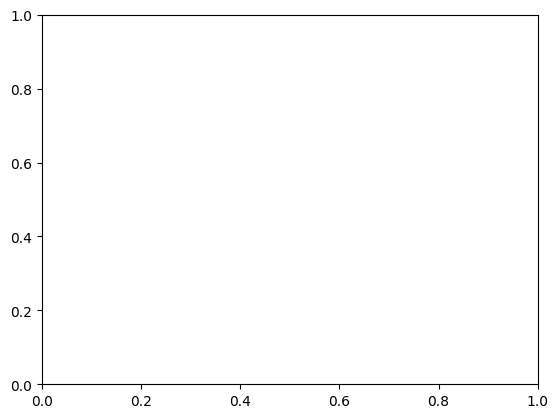

In [ ]:
acc_train=model_history.history['accuracy']
acc_val=model_history.history['val_accuracy']
epochs=range(1,42)
plt.plot(epochs,acc_train,'g',label='Training Accuracy')
plt.plot(epochs,acc_val,'b',label='Validation Accuracy')
plt.title("Training and Validation Accuracy")
plt.xlabel("Epochs")
plt.ylabel("Accuracy")
plt.legend()
plt.show()

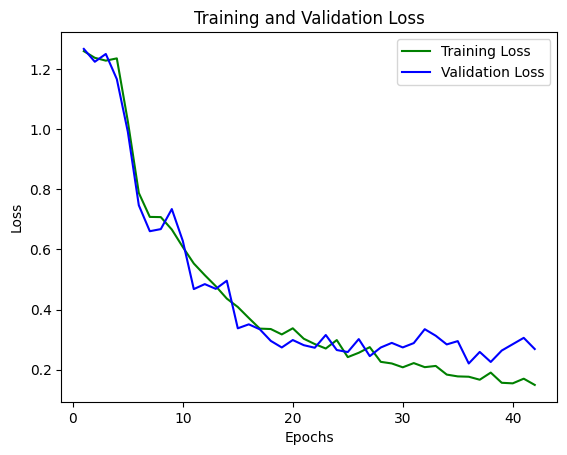

In [ ]:
loss_train=model_history.history['loss']
loss_val=model_history.history['val_loss']
epochs=range(1,42)
plt.plot(epochs,loss_train,'g',label='Training Loss')
plt.plot(epochs,loss_val,'b',label='Validation Loss')
plt.title("Training and Validation Loss")
plt.xlabel("Epochs")
plt.ylabel("Loss")
plt.legend()
plt.show()

1/1 [==============================] - 0s 163ms/step


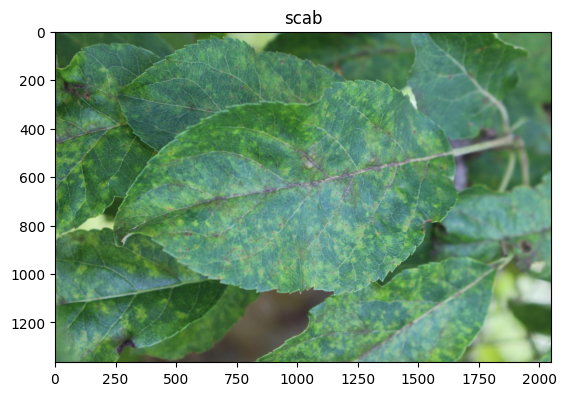

In [25]:
import numpy as np
import matplotlib.pyplot as plt
from tensorflow.keras.preprocessing import image
from PIL import Image  # Import Image module from PIL (Pillow)

test_image_path='/content/drive/MyDrive/apple/images/test/Test_100.jpg'

# Open the image using PIL
image_result = Image.open(test_image_path)

# Load and preprocess the image using Keras
test_image = image.load_img(test_image_path, target_size=(224, 224))
test_image = image.img_to_array(test_image)
test_image = test_image / 255
test_image = np.expand_dims(test_image, axis=0)

# Assuming 'model' is defined and loaded with the appropriate architecture and weights
result = model.predict(test_image)
predicted_class = np.argmax(result)
categories = ['healthy', 'multiple_disease', 'rust', 'scab']
predicted_category = categories[predicted_class]

# Display the image and the predicted category
plt.imshow(image_result)
plt.title(predicted_category)
plt.show()